In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

## **DIfferent Datasets Read**





*   Daily





In [3]:
amvt_1=pd.read_csv("/content/1D_24_1406_Secretariat_Amaravati_APPCB.csv")
ic_1=pd.read_csv("/content/1D_24_251_ICRISAT_Patancheru_Hyderabad_TSPCB.csv")
pl_1=pd.read_csv("/content/1D_24_252_Plammoodu_Thiruvananthapuram_Kerala_PCB.csv")
av_1=pd.read_csv("/content/1D_24_301_Anand_Vihar_Delhi_DPCC.csv")
cps_1=pd.read_csv("/content/1D_24_5107_Chhatrapati_Shivaji_Intl._Airport_(T2)_Mumbai_MPCB.csv")
bally_1=pd.read_csv("/content/1D_24_5238_Ballygunge_Kolkata_WBPCB.csv")
kp_1=pd.read_csv("/content/1D_24_5462_Kukrail_Picnic_Spot-1_Lucknow_UPPCB.csv")
lg_1=pd.read_csv("/content/1D_24_5683_LGBI_Airport_Guwahati_PCBA.csv")
gg_1=pd.read_csv("/content/1D_24_5704_Govt._Girls_Inter_College_Kashipur_UKPCB.csv")
dh_1=pd.read_csv("/content/1D_24_5707_Dhanmandi_Kota_RSPCB.csv")

In [4]:
all_data_1=[amvt_1,ic_1,pl_1,av_1,cps_1,bally_1,kp_1,lg_1,gg_1,dh_1]

In [5]:
columns_to_drop = [
    'Xylene (µg/m³)', 'O Xylene (µg/m³)', 'Eth-Benzene (µg/m³)', 'MP-Xylene (µg/m³)',
    'RF (mm)', 'VWS (m/s)', 'Benzene (µg/m³)', 'Toluene (µg/m³)', 'TOT-RF (mm)','PM10 (µg/m³)'
]

for df in all_data_1:
    for col in columns_to_drop:
        if col in df.columns:
            df.drop(columns=[col], inplace=True)



*   Hourly




In [6]:
amvt=pd.read_csv("/content/1Hr_24_1406_Secretariat_Amaravati_APPCB.csv")
ic=pd.read_csv("/content/1Hr_24_251_ICRISAT_Patancheru_Hyderabad_TSPCB.csv")
pl=pd.read_csv("/content/1Hr_24_252_Plammoodu_Thiruvananthapuram_Kerala_PCB.csv")
av=pd.read_csv("/content/1Hr_24_301_Anand_Vihar_Delhi_DPCC.csv")
cps=pd.read_csv("/content/1Hr_24_5107_Chhatrapati_Shivaji_Intl._Airport_(T2)_Mumbai_MPCB.csv")
bally=pd.read_csv("/content/1Hr_2024_5238_Ballygunge_Kolkata_WBPCB.csv")
kp=pd.read_csv("/content/1Hr_24_5462_Kukrail_Picnic_Spot-1_Lucknow_UPPCB.csv")
lg=pd.read_csv("/content/1Hr_24_5683_LGBI_Airport_Guwahati_PCBA.csv")
gg=pd.read_csv("/content/1Hr_24_5704_Govt._Girls_Inter_College_Kashipur_UKPCB.csv")
dh=pd.read_csv("/content/1Hr_24_5707_Dhanmandi_Kota_RSPCB.csv")

In [7]:
lg['Timestamp'] = pl['Timestamp'].values

dh['Timestamp'] = pl['Timestamp'].values

lg_1['Timestamp'] = pl_1['Timestamp'].values

dh_1['Timestamp'] = pl_1['Timestamp'].values



In [8]:
all_data=[amvt,ic,pl,av,cps,bally,kp,lg,gg,dh]

In [9]:

columns_to_drop = [
    'Xylene (µg/m³)', 'O Xylene (µg/m³)', 'Eth-Benzene (µg/m³)', 'MP-Xylene (µg/m³)',
    'RF (mm)', 'VWS (m/s)', 'Benzene (µg/m³)', 'Toluene (µg/m³)', 'TOT-RF (mm)','PM10 (µg/m³)'
]

for df in all_data:
    for col in columns_to_drop:
        if col in df.columns:
            df.drop(columns=[col], inplace=True)

In [10]:
def merge_and_fill_hourly_with_daily(hourly_df, daily_df):


    # Extract just the date part
    hourly_df['date'] = pd.to_datetime(hourly_df['Timestamp'], format="mixed").dt.date
    daily_df['date'] = pd.to_datetime(daily_df['Timestamp'], format="mixed").dt.date

    # Merge hourly with daily values
    df_merged = hourly_df.merge(daily_df, on='date', how='left', suffixes=('', '_daily'))

    # Columns to fill
    cols_to_fill = [
        'PM2.5 (µg/m³)', 'NO2 (µg/m³)', 'SO2 (µg/m³)', 'CO (mg/m³)',
        'Ozone (µg/m³)', 'NH3 (µg/m³)', 'NO (µg/m³)', 'NOx (ppb)',
        'WS (m/s)', 'RH (%)', 'AT (°C)', 'BP (mmHg)', 'SR (W/mt2)', 'WD (deg)'
    ]

    # Fill missing hourly values with daily values
    for col in cols_to_fill:
        if f'{col}_daily' in df_merged.columns:
            df_merged[col] = df_merged[col].fillna(df_merged[f'{col}_daily'])

    # Drop the extra daily columns
    df_merged.drop(columns=[f'{col}_daily' for col in cols_to_fill if f'{col}_daily' in df_merged.columns], inplace=True)

    # Drop the helper 'date' column
    df_merged.drop(columns=['date','Timestamp_daily'], inplace=True)

    # Update the original hourly_df in-place (if needed externally)
    hourly_df.drop(hourly_df.index, inplace=True)
    for col in df_merged.columns:
        hourly_df[col] = df_merged[col]



In [11]:
merge_and_fill_hourly_with_daily(amvt, amvt_1)
merge_and_fill_hourly_with_daily(ic, ic_1)
merge_and_fill_hourly_with_daily(pl, pl_1)
merge_and_fill_hourly_with_daily(av, av_1)
merge_and_fill_hourly_with_daily(cps, cps_1)
merge_and_fill_hourly_with_daily(bally, bally_1)
merge_and_fill_hourly_with_daily(kp, kp_1)
merge_and_fill_hourly_with_daily(lg, lg_1)
merge_and_fill_hourly_with_daily(gg, gg_1)
merge_and_fill_hourly_with_daily(dh, dh_1)


In [12]:
for df in all_data:

    df.drop(columns=['date'], inplace=True)

# Null Values Count

In [13]:
def null_sum(df):
    null_counts = df.isnull().sum()
    null_percent = (null_counts / len(df)) * 100

    summary = pd.DataFrame({
        'column name':df.columns,
        'Null Count': null_counts,
        'Percent (%)': null_percent.round(2),
        'Data Type': df.dtypes,
        'Non Null': df.count()
    })
    summary.index = range(1, len(summary) + 1)
    summary.index.name = 'S.No.'
    return summary



In [14]:
null_sum(amvt)

,column name,Null Count,Percent (%),Data Type,Non Null
S.No.,,,,,
1,Timestamp,0,0.00,object,8784
2,PM2.5 (µg/m³),96,1.09,float64,8688
3,NO (µg/m³),96,1.09,float64,8688
4,NO2 (µg/m³),96,1.09,float64,8688
5,NOx (ppb),96,1.09,float64,8688
6,NH3 (µg/m³),96,1.09,float64,8688
7,SO2 (µg/m³),96,1.09,float64,8688
8,CO (mg/m³),96,1.09,float64,8688
9,Ozone (µg/m³),96,1.09,float64,8688


In [15]:
null_sum(ic)

,column name,Null Count,Percent (%),Data Type,Non Null
S.No.,,,,,
1,Timestamp,0,0.00,object,8784
2,PM2.5 (µg/m³),72,0.82,float64,8712
3,NO (µg/m³),48,0.55,float64,8736
4,NO2 (µg/m³),48,0.55,float64,8736
5,NOx (ppb),48,0.55,float64,8736
6,NH3 (µg/m³),48,0.55,float64,8736
7,SO2 (µg/m³),96,1.09,float64,8688
8,CO (mg/m³),48,0.55,float64,8736
9,Ozone (µg/m³),96,1.09,float64,8688


In [16]:
null_sum(pl)

,column name,Null Count,Percent (%),Data Type,Non Null
S.No.,,,,,
1,Timestamp,0,0.00,object,8784
2,PM2.5 (µg/m³),216,2.46,float64,8568
3,NO (µg/m³),48,0.55,float64,8736
4,NO2 (µg/m³),48,0.55,float64,8736
5,NOx (ppb),48,0.55,float64,8736
6,NH3 (µg/m³),48,0.55,float64,8736
7,SO2 (µg/m³),48,0.55,float64,8736
8,CO (mg/m³),48,0.55,float64,8736
9,Ozone (µg/m³),48,0.55,float64,8736


In [17]:
null_sum(av)

,column name,Null Count,Percent (%),Data Type,Non Null
S.No.,,,,,
1,Timestamp,0,0.00,object,8784
2,PM2.5 (µg/m³),528,6.01,float64,8256
3,NO (µg/m³),528,6.01,float64,8256
4,NO2 (µg/m³),552,6.28,float64,8232
5,NOx (ppb),528,6.01,float64,8256
6,NH3 (µg/m³),528,6.01,float64,8256
7,SO2 (µg/m³),576,6.56,float64,8208
8,CO (mg/m³),576,6.56,float64,8208
9,Ozone (µg/m³),648,7.38,float64,8136


In [18]:
null_sum(cps)

,column name,Null Count,Percent (%),Data Type,Non Null
S.No.,,,,,
1,Timestamp,0,0.00,object,8784
2,PM2.5 (µg/m³),24,0.27,float64,8760
3,NO (µg/m³),288,3.28,float64,8496
4,NO2 (µg/m³),528,6.01,float64,8256
5,NOx (ppb),288,3.28,float64,8496
6,NH3 (µg/m³),624,7.10,float64,8160
7,SO2 (µg/m³),48,0.55,float64,8736
8,CO (mg/m³),24,0.27,float64,8760
9,Ozone (µg/m³),288,3.28,float64,8496


In [19]:
null_sum(bally)

,column name,Null Count,Percent (%),Data Type,Non Null
S.No.,,,,,
1,Timestamp,0,0.0,object,8784
2,PM2.5 (µg/m³),0,0.0,float64,8784
3,NO (µg/m³),0,0.0,float64,8784
4,NO2 (µg/m³),0,0.0,float64,8784
5,NOx (ppb),0,0.0,float64,8784
6,NH3 (µg/m³),0,0.0,float64,8784
7,SO2 (µg/m³),0,0.0,float64,8784
8,CO (mg/m³),0,0.0,float64,8784
9,Ozone (µg/m³),0,0.0,float64,8784


In [20]:
null_sum(kp)

,column name,Null Count,Percent (%),Data Type,Non Null
S.No.,,,,,
1,Timestamp,0,0.00,object,8784
2,PM2.5 (µg/m³),0,0.00,float64,8784
3,NO (µg/m³),0,0.00,float64,8784
4,NO2 (µg/m³),0,0.00,float64,8784
5,NOx (ppb),0,0.00,float64,8784
6,NH3 (µg/m³),0,0.00,float64,8784
7,SO2 (µg/m³),0,0.00,float64,8784
8,CO (mg/m³),0,0.00,float64,8784
9,Ozone (µg/m³),0,0.00,float64,8784


In [21]:
null_sum(lg)

,column name,Null Count,Percent (%),Data Type,Non Null
S.No.,,,,,
1,Timestamp,0,0.00,object,8784
2,PM2.5 (µg/m³),24,0.27,float64,8760
3,NO (µg/m³),24,0.27,float64,8760
4,NO2 (µg/m³),24,0.27,float64,8760
5,NOx (ppb),24,0.27,float64,8760
6,NH3 (µg/m³),24,0.27,float64,8760
7,SO2 (µg/m³),24,0.27,float64,8760
8,CO (mg/m³),456,5.19,float64,8328
9,Ozone (µg/m³),24,0.27,float64,8760


In [22]:
null_sum(gg)

,column name,Null Count,Percent (%),Data Type,Non Null
S.No.,,,,,
1,Timestamp,0,0.00,object,8784
2,PM2.5 (µg/m³),48,0.55,float64,8736
3,NO (µg/m³),24,0.27,float64,8760
4,NO2 (µg/m³),24,0.27,float64,8760
5,NOx (ppb),24,0.27,float64,8760
6,NH3 (µg/m³),96,1.09,float64,8688
7,SO2 (µg/m³),216,2.46,float64,8568
8,CO (mg/m³),24,0.27,float64,8760
9,Ozone (µg/m³),24,0.27,float64,8760


In [23]:
null_sum(dh)

,column name,Null Count,Percent (%),Data Type,Non Null
S.No.,,,,,
1,Timestamp,0,0.00,object,8784
2,PM2.5 (µg/m³),0,0.00,float64,8784
3,NO (µg/m³),0,0.00,float64,8784
4,NO2 (µg/m³),0,0.00,float64,8784
5,NOx (ppb),0,0.00,float64,8784
6,NH3 (µg/m³),0,0.00,float64,8784
7,SO2 (µg/m³),0,0.00,float64,8784
8,CO (mg/m³),0,0.00,float64,8784
9,Ozone (µg/m³),0,0.00,float64,8784


# Missing values handling

Skewness

In [24]:
def skewness(df, exclude_col='Timestamp'):

    temp_df = df.drop(columns=[exclude_col], errors='ignore')
    skew_values = temp_df.skew()

    for col, skew in skew_values.items():
        print(f"{col}: {skew:.3f}")


heatmap

In [25]:
def heatmap(df, exclude_col='Timestamp', figsize=(10, 8), cmap='coolwarm'):

    # Drop column (e.g., Timestamp)
    cleaned_df = df.drop(columns=[exclude_col], errors='ignore')

    # Compute correlation
    corr_matrix = cleaned_df.corr()

    # Plot heatmap
    plt.figure(figsize=figsize)
    sns.heatmap(corr_matrix, annot=True, cmap=cmap, fmt=".3f")
    plt.title('Correlation Heatmap (Enhanced Contrast)')
    plt.tight_layout()
    plt.show()


histplot

In [26]:
# Generates distribution plots with skewness for all numeric columns of a DataFrame on a single canvas.

def plot_with_skewness(df):
    numeric_cols = df.select_dtypes(include=np.number).columns
    n_cols = 3
    n_rows = (len(numeric_cols) + n_cols - 1) // n_cols
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, n_rows * 5))
    axes = axes.flatten()  # Flatten the 2D array of axes
    for i, col in enumerate(numeric_cols):
        sns.histplot(df[col].dropna(), kde=True, ax=axes[i])
        skewness = df[col].skew()
        axes[i].set_title(f'Distribution of {col} (Skewness: {skewness:.2f})')

    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])
    plt.tight_layout()
    plt.show()

## 1) amvt

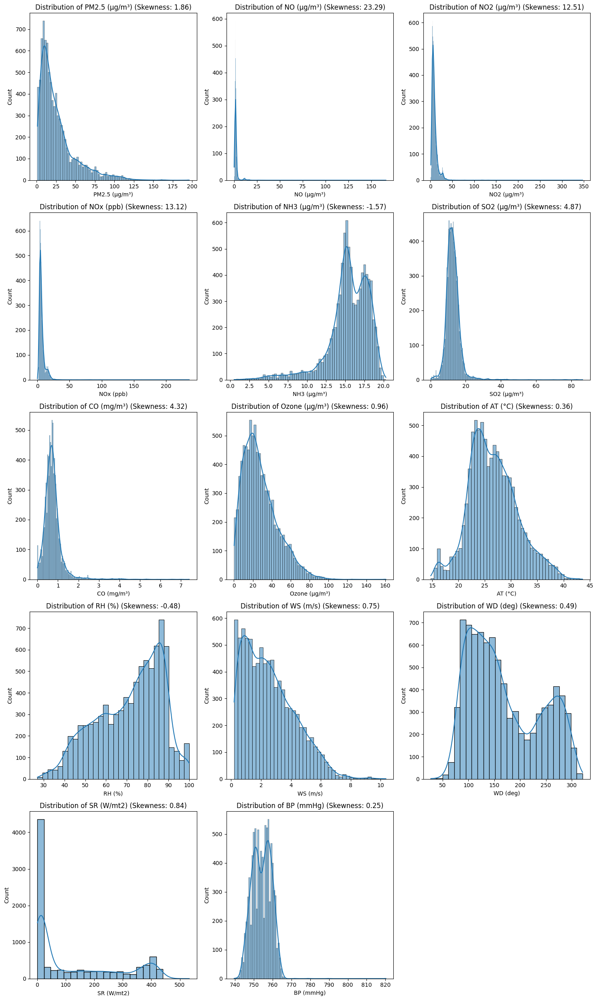

In [27]:
plot_with_skewness(amvt)

In [28]:
skewness(amvt)

PM2.5 (µg/m³): 1.857
NO (µg/m³): 23.287
NO2 (µg/m³): 12.509
NOx (ppb): 13.118
NH3 (µg/m³): -1.575
SO2 (µg/m³): 4.871
CO (mg/m³): 4.320
Ozone (µg/m³): 0.963
AT (°C): 0.363
RH (%): -0.485
WS (m/s): 0.746
WD (deg): 0.491
SR (W/mt2): 0.842
BP (mmHg): 0.247


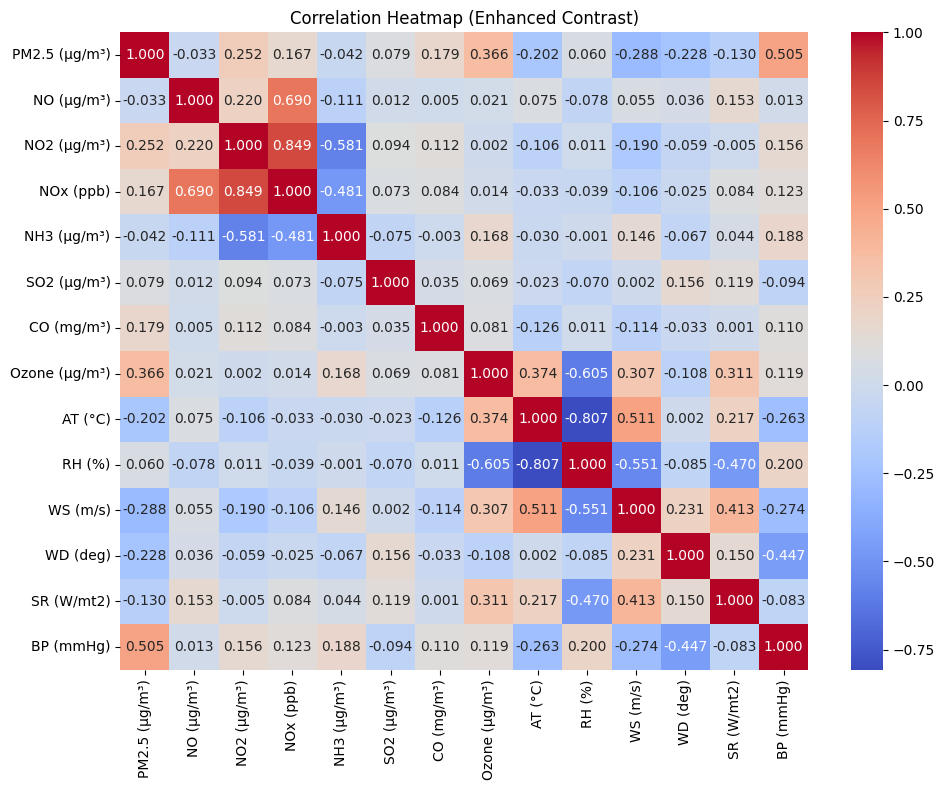

In [29]:
heatmap(amvt)

In [30]:
amvt_nn=amvt.copy()

In [31]:
amvt_nn = amvt_nn.dropna(subset=['PM2.5 (µg/m³)'])


In [32]:
null_sum(amvt_nn)

,column name,Null Count,Percent (%),Data Type,Non Null
S.No.,,,,,
1,Timestamp,0,0.00,object,8688
2,PM2.5 (µg/m³),0,0.00,float64,8688
3,NO (µg/m³),0,0.00,float64,8688
4,NO2 (µg/m³),0,0.00,float64,8688
5,NOx (ppb),0,0.00,float64,8688
6,NH3 (µg/m³),0,0.00,float64,8688
7,SO2 (µg/m³),0,0.00,float64,8688
8,CO (mg/m³),0,0.00,float64,8688
9,Ozone (µg/m³),0,0.00,float64,8688


In [33]:
amvt_nn['RH (%)'] = amvt_nn['RH (%)'].fillna(amvt_nn['RH (%)'].median())   #fiiling the missing values with the median


In [34]:
null_sum(amvt_nn)

,column name,Null Count,Percent (%),Data Type,Non Null
S.No.,,,,,
1,Timestamp,0,0.0,object,8688
2,PM2.5 (µg/m³),0,0.0,float64,8688
3,NO (µg/m³),0,0.0,float64,8688
4,NO2 (µg/m³),0,0.0,float64,8688
5,NOx (ppb),0,0.0,float64,8688
6,NH3 (µg/m³),0,0.0,float64,8688
7,SO2 (µg/m³),0,0.0,float64,8688
8,CO (mg/m³),0,0.0,float64,8688
9,Ozone (µg/m³),0,0.0,float64,8688


In [35]:
skewness(amvt_nn)

PM2.5 (µg/m³): 1.857
NO (µg/m³): 23.287
NO2 (µg/m³): 12.509
NOx (ppb): 13.118
NH3 (µg/m³): -1.575
SO2 (µg/m³): 4.871
CO (mg/m³): 4.320
Ozone (µg/m³): 0.963
AT (°C): 0.363
RH (%): -0.503
WS (m/s): 0.746
WD (deg): 0.491
SR (W/mt2): 0.842
BP (mmHg): 0.247


In [36]:
amvt_nn.to_csv('amvt_nn.csv', index=False)

## 2) ic

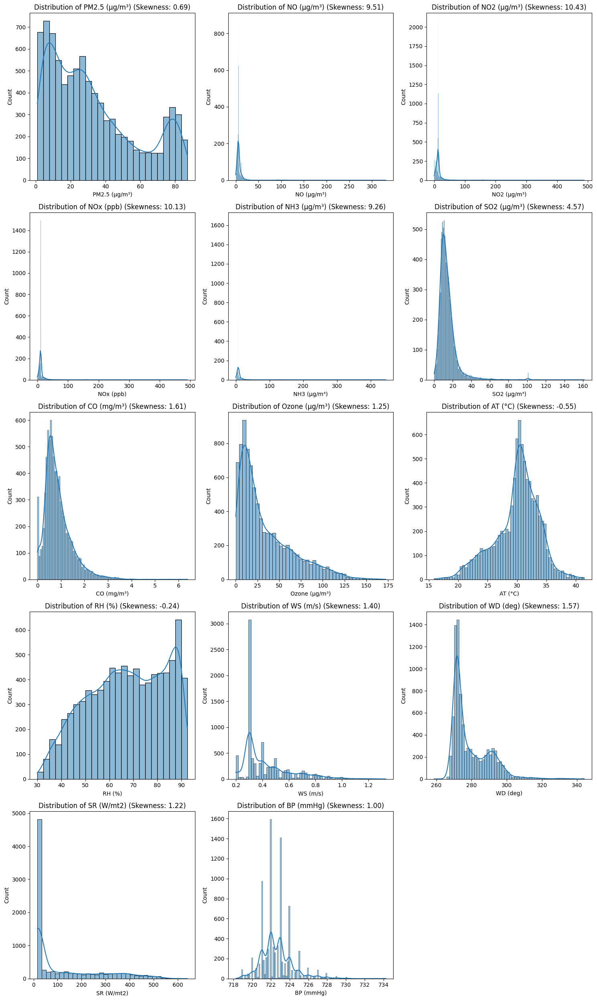

In [37]:
plot_with_skewness(ic)

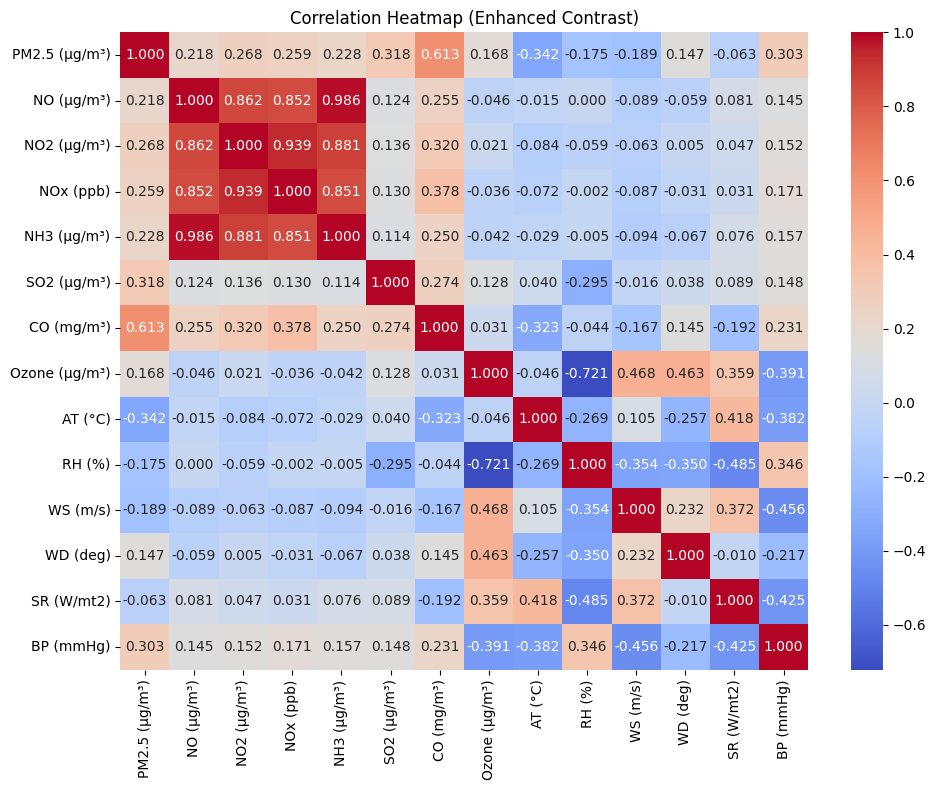

In [38]:
heatmap(ic)

In [39]:
ic_nn=ic.copy()

In [40]:
ic_nn= ic_nn.dropna(subset=['PM2.5 (µg/m³)'])

In [41]:
ic_nn['SO2 (µg/m³)'] = ic_nn['SO2 (µg/m³)'].fillna(ic_nn['SO2 (µg/m³)'].median())
ic_nn['Ozone (µg/m³)'] = ic_nn['Ozone (µg/m³)'].fillna(ic_nn['Ozone (µg/m³)']).interpolate()

In [42]:
null_sum(ic_nn)

,column name,Null Count,Percent (%),Data Type,Non Null
S.No.,,,,,
1,Timestamp,0,0.0,object,8712
2,PM2.5 (µg/m³),0,0.0,float64,8712
3,NO (µg/m³),0,0.0,float64,8712
4,NO2 (µg/m³),0,0.0,float64,8712
5,NOx (ppb),0,0.0,float64,8712
6,NH3 (µg/m³),0,0.0,float64,8712
7,SO2 (µg/m³),0,0.0,float64,8712
8,CO (mg/m³),0,0.0,float64,8712
9,Ozone (µg/m³),0,0.0,float64,8712


In [43]:
skewness(ic_nn)

PM2.5 (µg/m³): 0.694
NO (µg/m³): 9.504
NO2 (µg/m³): 10.427
NOx (ppb): 10.120
NH3 (µg/m³): 9.250
SO2 (µg/m³): 4.585
CO (mg/m³): 1.605
Ozone (µg/m³): 1.251
AT (°C): -0.545
RH (%): -0.235
WS (m/s): 1.399
WD (deg): 1.564
SR (W/mt2): 1.222
BP (mmHg): 0.997


In [44]:
ic_nn.to_csv('ic_un.csv', index=False)

## 3) PL

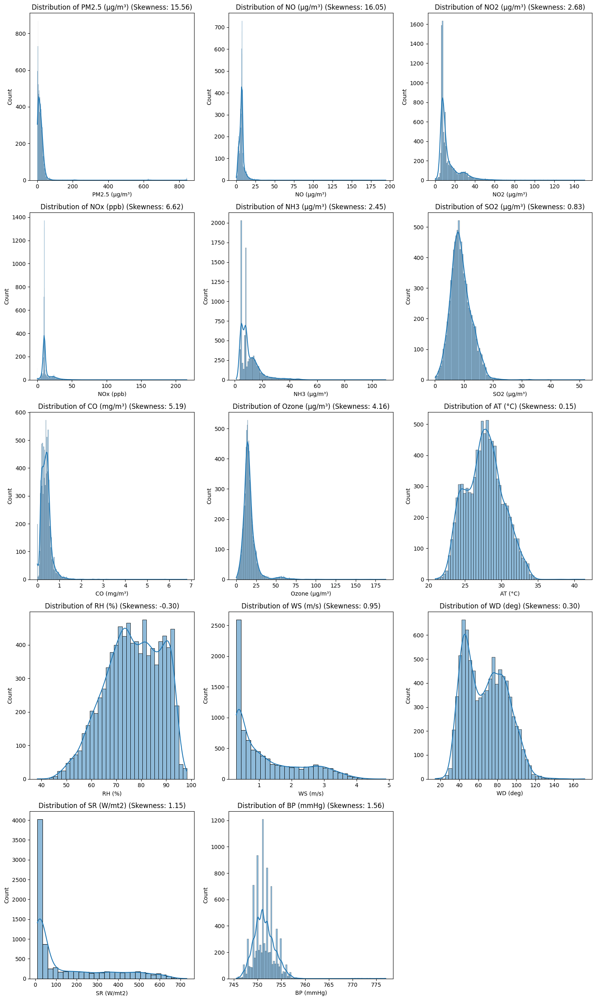

In [45]:
plot_with_skewness(pl)

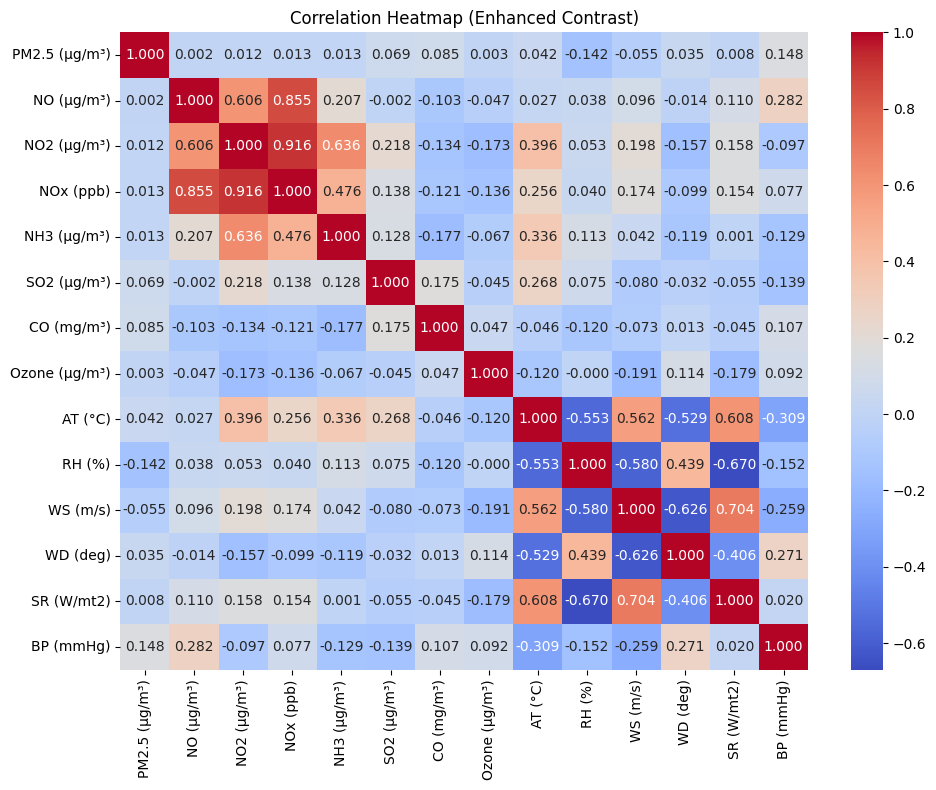

In [46]:
heatmap(pl)

In [47]:
skewness(pl)

PM2.5 (µg/m³): 15.557
NO (µg/m³): 16.054
NO2 (µg/m³): 2.675
NOx (ppb): 6.624
NH3 (µg/m³): 2.448
SO2 (µg/m³): 0.825
CO (mg/m³): 5.189
Ozone (µg/m³): 4.162
AT (°C): 0.147
RH (%): -0.302
WS (m/s): 0.948
WD (deg): 0.296
SR (W/mt2): 1.150
BP (mmHg): 1.565


In [48]:
pl_nn=pl.copy()

In [49]:
pl_nn = pl_nn.dropna(subset=['PM2.5 (µg/m³)'])

In [50]:
null_sum(pl_nn)

,column name,Null Count,Percent (%),Data Type,Non Null
S.No.,,,,,
1,Timestamp,0,0.0,object,8568
2,PM2.5 (µg/m³),0,0.0,float64,8568
3,NO (µg/m³),0,0.0,float64,8568
4,NO2 (µg/m³),0,0.0,float64,8568
5,NOx (ppb),0,0.0,float64,8568
6,NH3 (µg/m³),0,0.0,float64,8568
7,SO2 (µg/m³),0,0.0,float64,8568
8,CO (mg/m³),0,0.0,float64,8568
9,Ozone (µg/m³),0,0.0,float64,8568


In [51]:
skewness(pl_nn)

PM2.5 (µg/m³): 15.557
NO (µg/m³): 16.232
NO2 (µg/m³): 2.774
NOx (ppb): 6.929
NH3 (µg/m³): 2.419
SO2 (µg/m³): 0.838
CO (mg/m³): 5.247
Ozone (µg/m³): 4.152
AT (°C): 0.151
RH (%): -0.302
WS (m/s): 0.949
WD (deg): 0.297
SR (W/mt2): 1.149
BP (mmHg): 1.571


In [52]:
pl_nn.to_csv('pl_nn.csv', index=False)

##4) AV

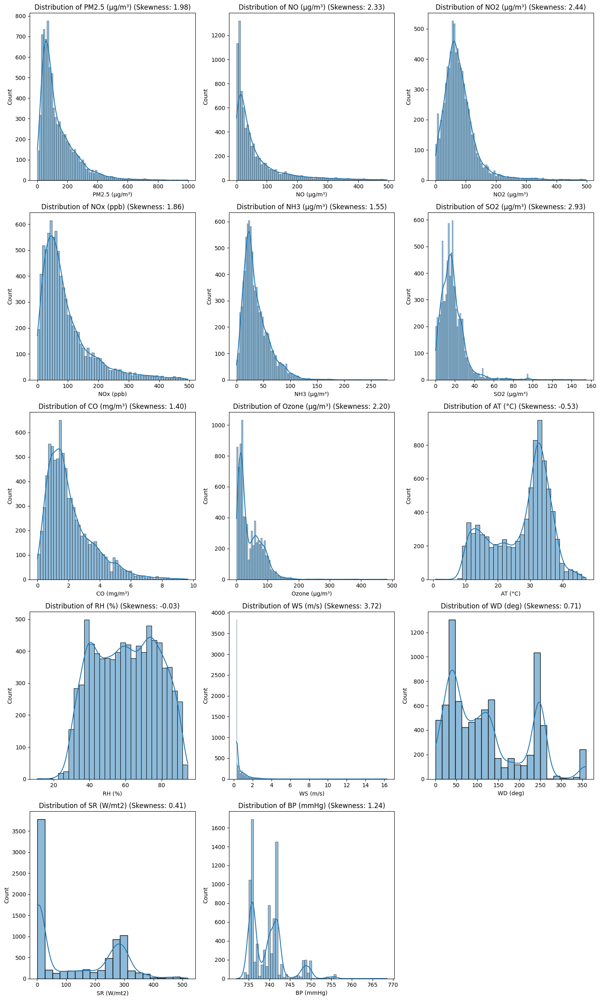

In [53]:
plot_with_skewness(av)

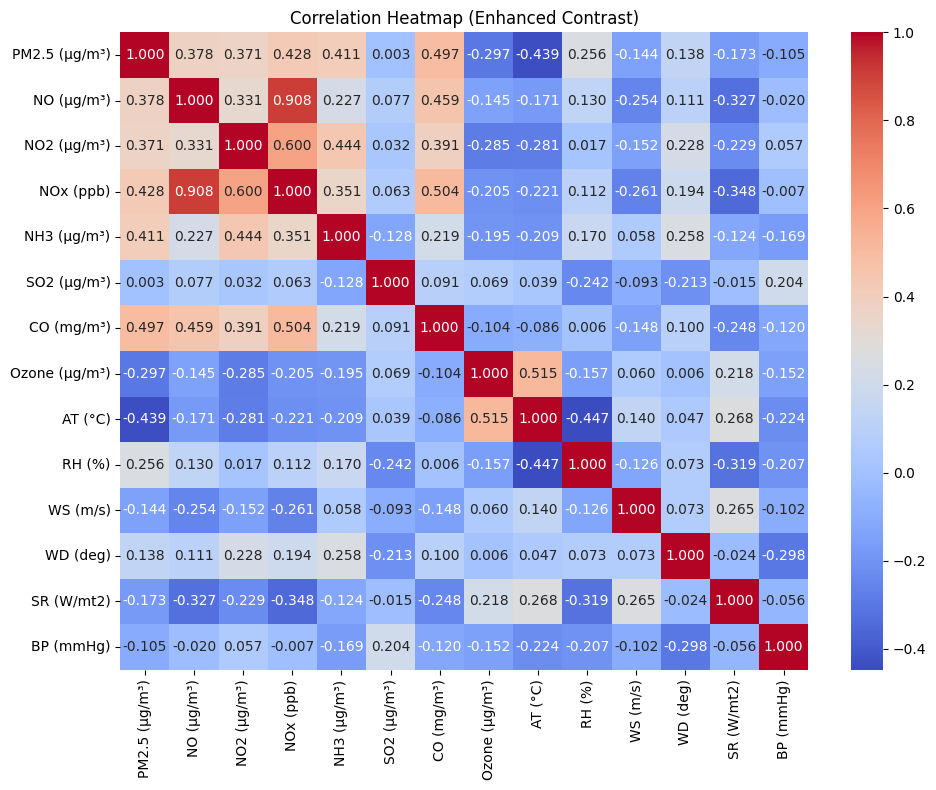

In [54]:
heatmap(av)

In [55]:
av_nn=av.copy()

In [56]:
av_nn = av_nn.dropna(subset=['PM2.5 (µg/m³)'])
av_nn = av_nn.dropna(subset=['WS (m/s)'])

In [57]:
av_nn['NO2 (µg/m³)'] = av_nn['NO2 (µg/m³)'].fillna(method='ffill')  # forward fill
av_nn['SO2 (µg/m³)'] = av_nn['SO2 (µg/m³)'].fillna(av_nn['SO2 (µg/m³)'].median())  # median for skewed pollutants
av_nn['CO (mg/m³)'] = av_nn['CO (mg/m³)'].fillna(av_nn['CO (mg/m³)'].mean())  # mean for stable measurements
av_nn['Ozone (µg/m³)'] = av_nn['Ozone (µg/m³)'].interpolate(method='linear')  # linear interpolation

/tmp/ipython-input-144651432.py:1: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  av_nn['NO2 (µg/m³)'] = av_nn['NO2 (µg/m³)'].fillna(method='ffill')  # forward fill


In [58]:
null_sum(av_nn)

,column name,Null Count,Percent (%),Data Type,Non Null
S.No.,,,,,
1,Timestamp,0,0.0,object,8040
2,PM2.5 (µg/m³),0,0.0,float64,8040
3,NO (µg/m³),0,0.0,float64,8040
4,NO2 (µg/m³),0,0.0,float64,8040
5,NOx (ppb),0,0.0,float64,8040
6,NH3 (µg/m³),0,0.0,float64,8040
7,SO2 (µg/m³),0,0.0,float64,8040
8,CO (mg/m³),0,0.0,float64,8040
9,Ozone (µg/m³),0,0.0,float64,8040


In [59]:
skewness(av_nn)

PM2.5 (µg/m³): 1.957
NO (µg/m³): 2.300
NO2 (µg/m³): 2.409
NOx (ppb): 1.827
NH3 (µg/m³): 1.536
SO2 (µg/m³): 3.019
CO (mg/m³): 1.394
Ozone (µg/m³): 2.209
AT (°C): -0.574
RH (%): -0.049
WS (m/s): 3.723
WD (deg): 0.689
SR (W/mt2): 0.412
BP (mmHg): 1.215


In [60]:
av_nn.to_csv('av_nn.csv', index=False)

##5) bally

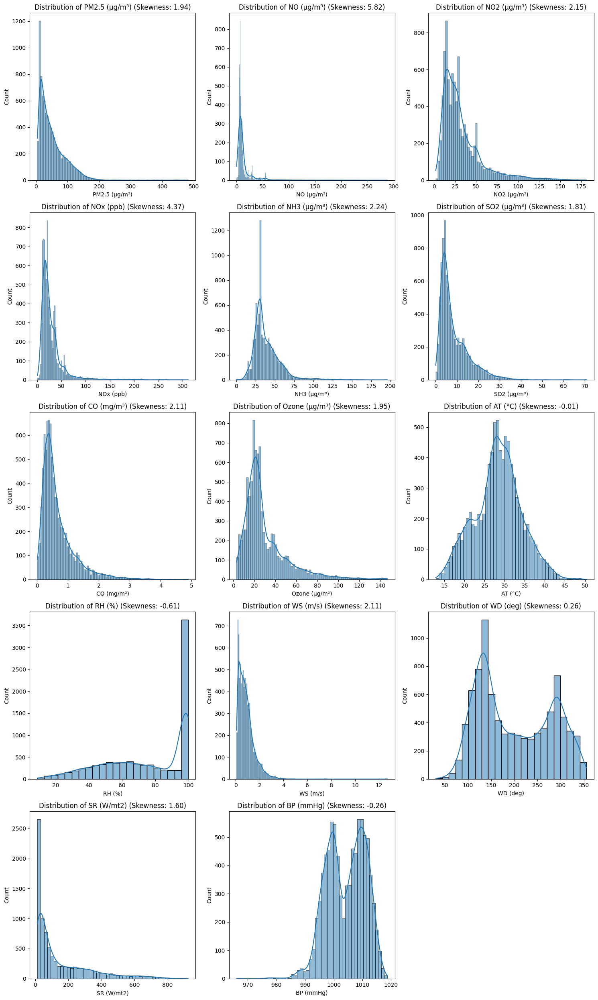

In [61]:
plot_with_skewness(bally)

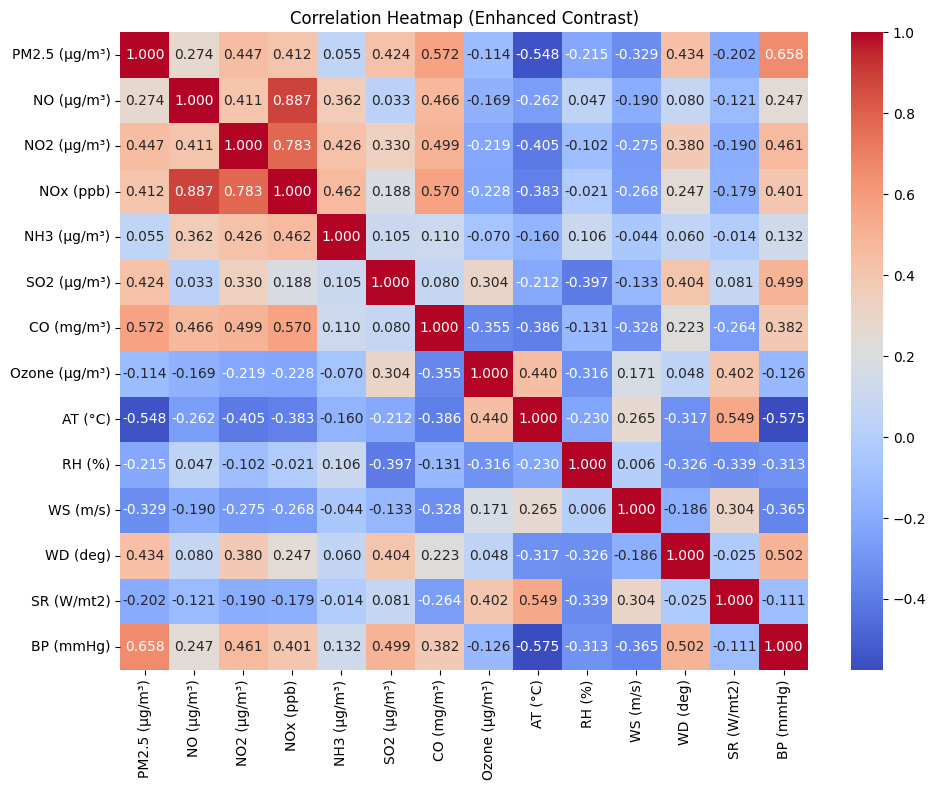

In [62]:
heatmap(bally)

In [63]:
bally_nn=bally.copy()

In [64]:
null_sum(bally_nn)

,column name,Null Count,Percent (%),Data Type,Non Null
S.No.,,,,,
1,Timestamp,0,0.0,object,8784
2,PM2.5 (µg/m³),0,0.0,float64,8784
3,NO (µg/m³),0,0.0,float64,8784
4,NO2 (µg/m³),0,0.0,float64,8784
5,NOx (ppb),0,0.0,float64,8784
6,NH3 (µg/m³),0,0.0,float64,8784
7,SO2 (µg/m³),0,0.0,float64,8784
8,CO (mg/m³),0,0.0,float64,8784
9,Ozone (µg/m³),0,0.0,float64,8784


In [65]:
bally_nn.to_csv("bally_nn.csv",index=False)

all values are filled already

##6)  CPS

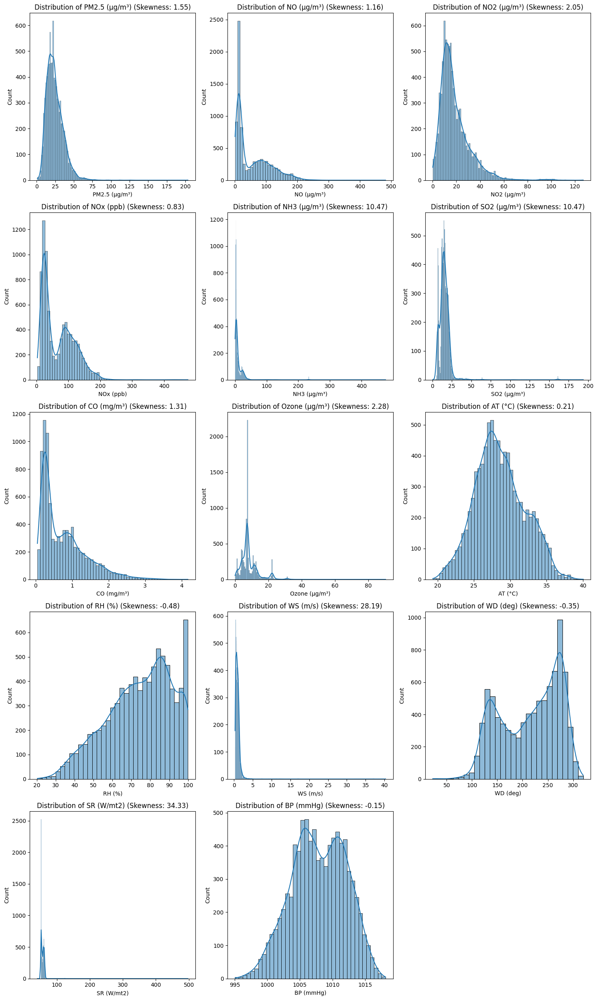

In [66]:
plot_with_skewness(cps)

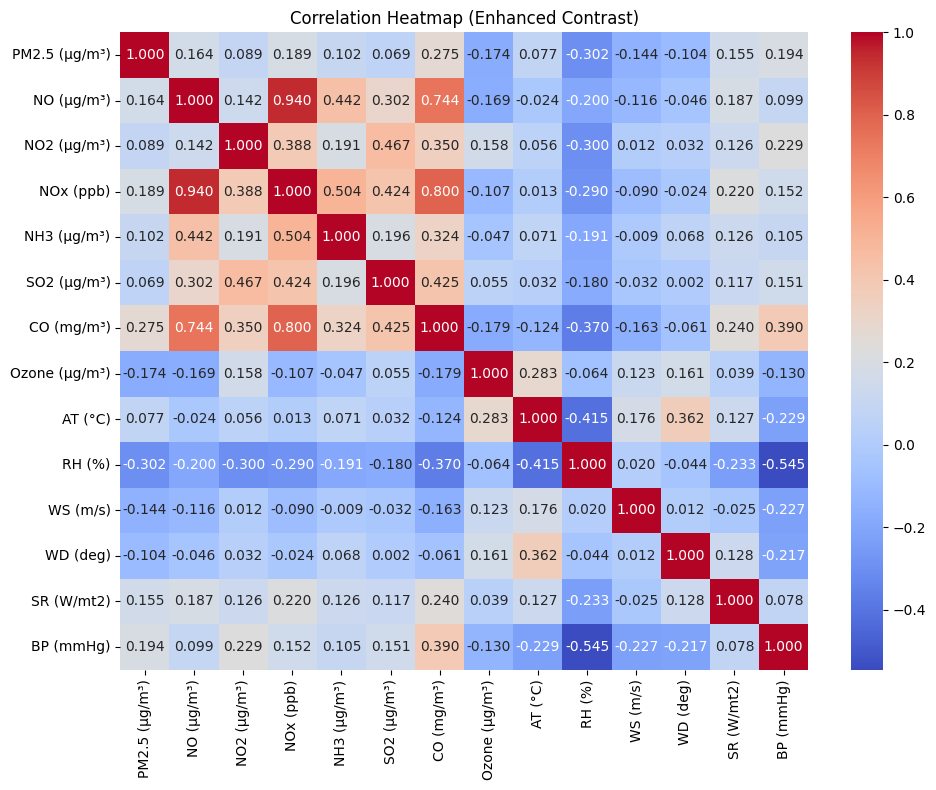

In [67]:
heatmap(cps)

In [68]:
cps_nn=cps.copy()

In [69]:
cps_nn=cps_nn.dropna(subset=['PM2.5 (µg/m³)'])


In [70]:
null_sum(cps_nn)

,column name,Null Count,Percent (%),Data Type,Non Null
S.No.,,,,,
1,Timestamp,0,0.00,object,8760
2,PM2.5 (µg/m³),0,0.00,float64,8760
3,NO (µg/m³),288,3.29,float64,8472
4,NO2 (µg/m³),528,6.03,float64,8232
5,NOx (ppb),288,3.29,float64,8472
6,NH3 (µg/m³),624,7.12,float64,8136
7,SO2 (µg/m³),48,0.55,float64,8712
8,CO (mg/m³),24,0.27,float64,8736
9,Ozone (µg/m³),288,3.29,float64,8472


In [71]:
# log transform for highly skewed columns
skewed_cols = ['NH3 (µg/m³)', 'SO2 (µg/m³)', 'WS (m/s)', 'SR (W/mt2)']
for col in skewed_cols:
    if col in cps_nn.columns:
        #  log1p to handle potential zero values
        cps_nn.loc[:, col] = cps_nn[col].apply(lambda x: np.log1p(x) if pd.notnull(x) and x >= 0 else x)
        cps_nn.loc[:, col] = cps_nn[col].fillna(cps_nn[col].median())


In [72]:
other_cols_to_fill = ['NO (µg/m³)', 'NO2 (µg/m³)', 'NOx (ppb)', 'CO (mg/m³)', 'Ozone (µg/m³)',
                      'AT (°C)', 'RH (%)', 'WD (deg)', 'BP (mmHg)']
for col in other_cols_to_fill:
    if col in cps_nn.columns:
        if cps_nn[col].skew() > 1 or cps_nn[col].skew() < -1: # median for skewed data
             cps_nn.loc[:, col] = cps_nn[col].fillna(cps_nn[col].median())
        else:                                                              #  interpolation for less skewed data
             cps_nn.loc[:, col] = cps_nn[col].interpolate(method='linear')

In [73]:
null_sum(cps_nn)

,column name,Null Count,Percent (%),Data Type,Non Null
S.No.,,,,,
1,Timestamp,0,0.0,object,8760
2,PM2.5 (µg/m³),0,0.0,float64,8760
3,NO (µg/m³),0,0.0,float64,8760
4,NO2 (µg/m³),0,0.0,float64,8760
5,NOx (ppb),0,0.0,float64,8760
6,NH3 (µg/m³),0,0.0,float64,8760
7,SO2 (µg/m³),0,0.0,float64,8760
8,CO (mg/m³),0,0.0,float64,8760
9,Ozone (µg/m³),0,0.0,float64,8760


In [74]:
skewness(cps_nn)

PM2.5 (µg/m³): 1.549
NO (µg/m³): 1.210
NO2 (µg/m³): 2.144
NOx (ppb): 0.749
NH3 (µg/m³): 1.095
SO2 (µg/m³): 0.518
CO (mg/m³): 1.309
Ozone (µg/m³): 2.328
AT (°C): 0.223
RH (%): -0.485
WS (m/s): 1.496
WD (deg): -0.355
SR (W/mt2): 6.298
BP (mmHg): -0.145


In [75]:
cps_nn.to_csv('cps_nn.csv', index=False)

##7)  kp

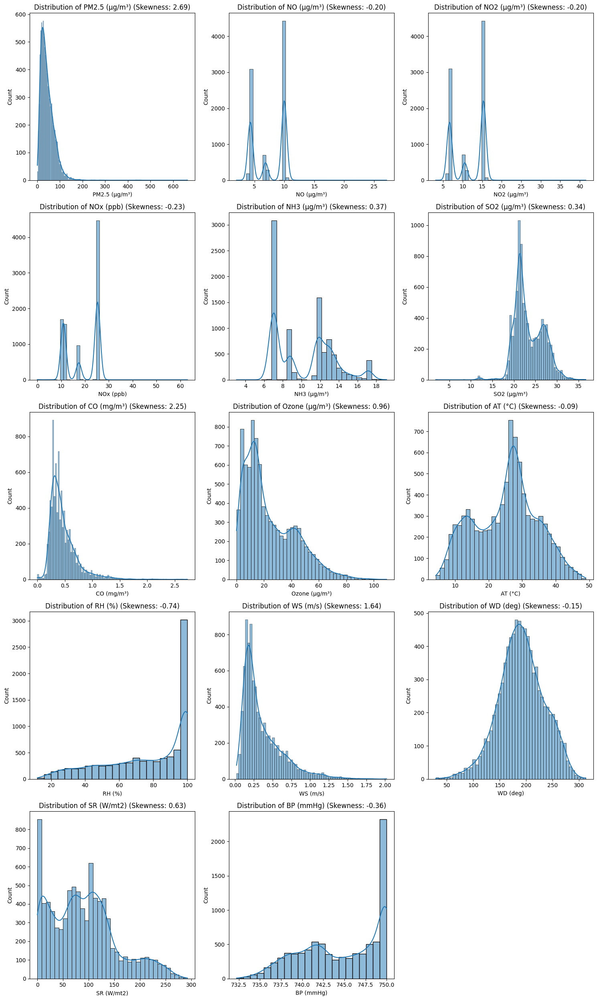

In [76]:
plot_with_skewness(kp)

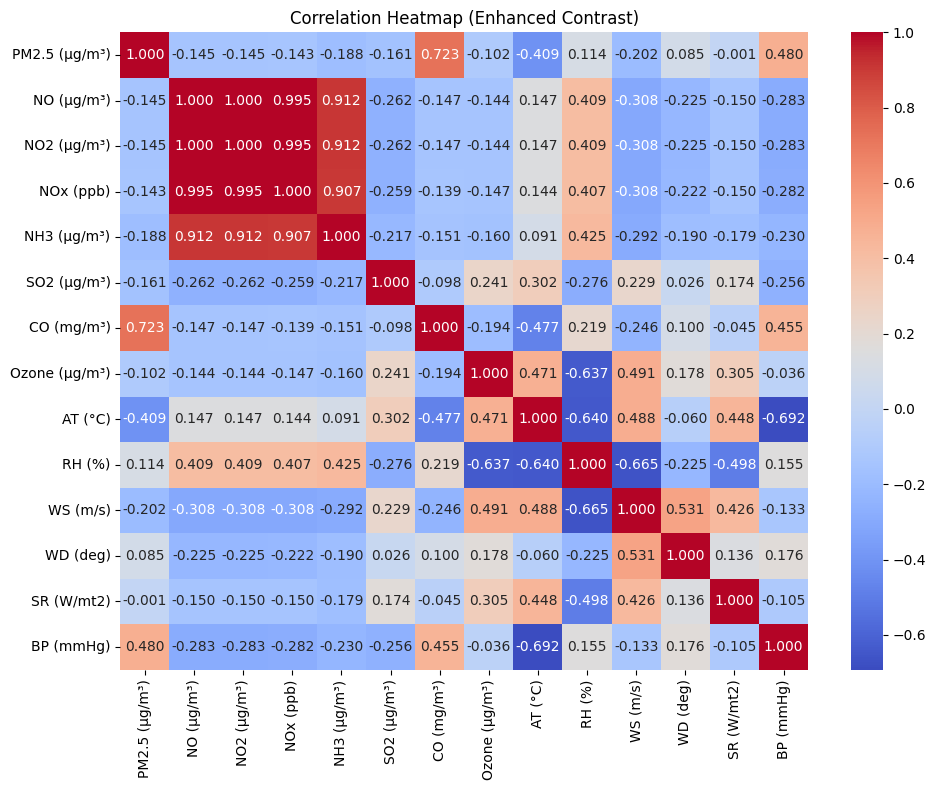

In [77]:
heatmap(kp)

pm 2.5 has no null only SR need to be treated

In [78]:
null_sum(kp)

,column name,Null Count,Percent (%),Data Type,Non Null
S.No.,,,,,
1,Timestamp,0,0.00,object,8784
2,PM2.5 (µg/m³),0,0.00,float64,8784
3,NO (µg/m³),0,0.00,float64,8784
4,NO2 (µg/m³),0,0.00,float64,8784
5,NOx (ppb),0,0.00,float64,8784
6,NH3 (µg/m³),0,0.00,float64,8784
7,SO2 (µg/m³),0,0.00,float64,8784
8,CO (mg/m³),0,0.00,float64,8784
9,Ozone (µg/m³),0,0.00,float64,8784


In [79]:
kp_nn=kp.copy()

In [80]:
kp_nn=kp_nn.dropna(subset=['SR (W/mt2)'])

In [81]:
null_sum(kp_nn)

,column name,Null Count,Percent (%),Data Type,Non Null
S.No.,,,,,
1,Timestamp,0,0.0,object,8736
2,PM2.5 (µg/m³),0,0.0,float64,8736
3,NO (µg/m³),0,0.0,float64,8736
4,NO2 (µg/m³),0,0.0,float64,8736
5,NOx (ppb),0,0.0,float64,8736
6,NH3 (µg/m³),0,0.0,float64,8736
7,SO2 (µg/m³),0,0.0,float64,8736
8,CO (mg/m³),0,0.0,float64,8736
9,Ozone (µg/m³),0,0.0,float64,8736


In [82]:
skewness(kp_nn)

PM2.5 (µg/m³): 2.705
NO (µg/m³): -0.196
NO2 (µg/m³): -0.196
NOx (ppb): -0.223
NH3 (µg/m³): 0.378
SO2 (µg/m³): 0.336
CO (mg/m³): 2.258
Ozone (µg/m³): 0.957
AT (°C): -0.093
RH (%): -0.738
WS (m/s): 1.633
WD (deg): -0.158
SR (W/mt2): 0.628
BP (mmHg): -0.368


In [83]:
kp_nn.to_csv('kp_nn.csv', index=False)

##8)  LG

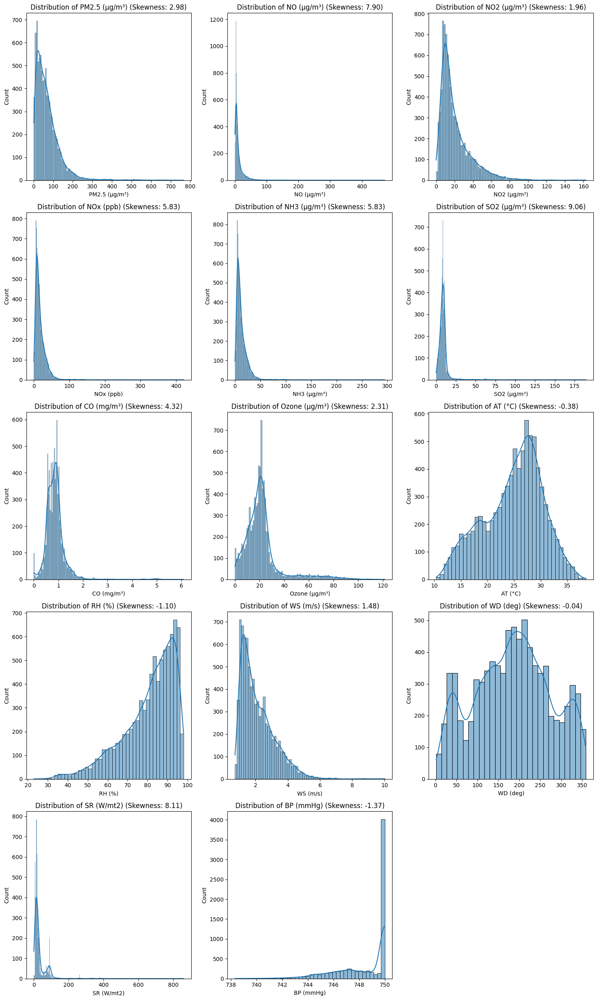

In [84]:
plot_with_skewness(lg)

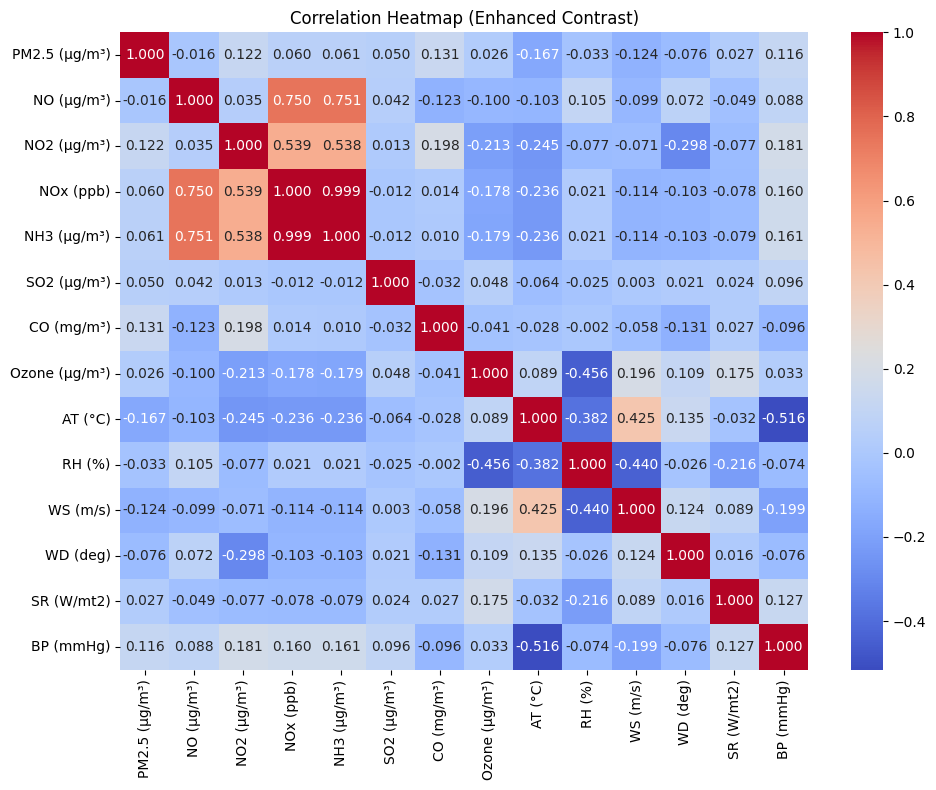

In [85]:
heatmap(lg)

In [86]:
null_sum(lg)

,column name,Null Count,Percent (%),Data Type,Non Null
S.No.,,,,,
1,Timestamp,0,0.00,object,8784
2,PM2.5 (µg/m³),24,0.27,float64,8760
3,NO (µg/m³),24,0.27,float64,8760
4,NO2 (µg/m³),24,0.27,float64,8760
5,NOx (ppb),24,0.27,float64,8760
6,NH3 (µg/m³),24,0.27,float64,8760
7,SO2 (µg/m³),24,0.27,float64,8760
8,CO (mg/m³),456,5.19,float64,8328
9,Ozone (µg/m³),24,0.27,float64,8760


In [87]:
lg_nn=lg.copy()

In [88]:
lg_nn=lg_nn.dropna(subset=['PM2.5 (µg/m³)'])

In [89]:
null_sum(lg_nn)

,column name,Null Count,Percent (%),Data Type,Non Null
S.No.,,,,,
1,Timestamp,0,0.00,object,8760
2,PM2.5 (µg/m³),0,0.00,float64,8760
3,NO (µg/m³),0,0.00,float64,8760
4,NO2 (µg/m³),0,0.00,float64,8760
5,NOx (ppb),0,0.00,float64,8760
6,NH3 (µg/m³),0,0.00,float64,8760
7,SO2 (µg/m³),0,0.00,float64,8760
8,CO (mg/m³),432,4.93,float64,8328
9,Ozone (µg/m³),0,0.00,float64,8760


In [90]:
skewness(lg_nn)

PM2.5 (µg/m³): 2.983
NO (µg/m³): 7.898
NO2 (µg/m³): 1.957
NOx (ppb): 5.833
NH3 (µg/m³): 5.832
SO2 (µg/m³): 9.059
CO (mg/m³): 4.322
Ozone (µg/m³): 2.308
AT (°C): -0.384
RH (%): -1.100
WS (m/s): 1.477
WD (deg): -0.038
SR (W/mt2): 8.108
BP (mmHg): -1.373


In [91]:
# Interpolate selected continuous columns (linear fill)
interpolate_cols = ['AT (°C)', 'CO (mg/m³)', 'WS (m/s)', 'BP (mmHg)']
lg_nn[interpolate_cols] = lg_nn[interpolate_cols].interpolate(method='linear', limit_direction='both')

# Fill low-importance columns with median
median_cols = ['RH (%)', 'WD (deg)', 'SR (W/mt2)']
for col in median_cols:
    lg_nn[col] = lg_nn[col].fillna(lg_nn[col].median())

In [92]:
skewness(lg_nn)

PM2.5 (µg/m³): 2.983
NO (µg/m³): 7.898
NO2 (µg/m³): 1.957
NOx (ppb): 5.833
NH3 (µg/m³): 5.832
SO2 (µg/m³): 9.059
CO (mg/m³): 4.046
Ozone (µg/m³): 2.308
AT (°C): -0.434
RH (%): -1.136
WS (m/s): 1.521
WD (deg): -0.044
SR (W/mt2): 8.386
BP (mmHg): -1.522


In [93]:
null_sum(lg_nn)

,column name,Null Count,Percent (%),Data Type,Non Null
S.No.,,,,,
1,Timestamp,0,0.0,object,8760
2,PM2.5 (µg/m³),0,0.0,float64,8760
3,NO (µg/m³),0,0.0,float64,8760
4,NO2 (µg/m³),0,0.0,float64,8760
5,NOx (ppb),0,0.0,float64,8760
6,NH3 (µg/m³),0,0.0,float64,8760
7,SO2 (µg/m³),0,0.0,float64,8760
8,CO (mg/m³),0,0.0,float64,8760
9,Ozone (µg/m³),0,0.0,float64,8760


In [94]:
lg_nn.to_csv('lg_nn.csv', index=False)

##9) GG

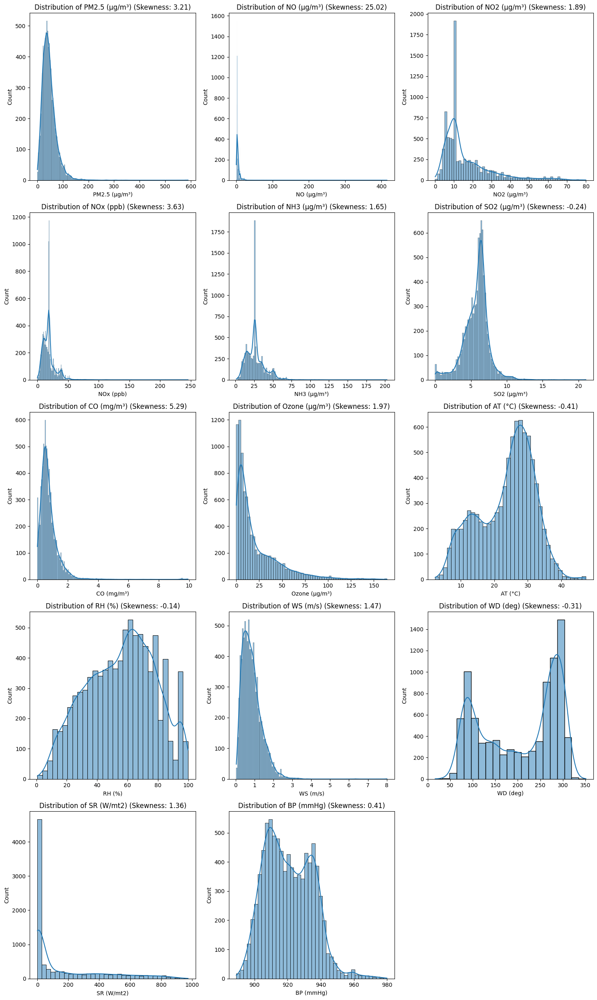

In [95]:
plot_with_skewness(gg)

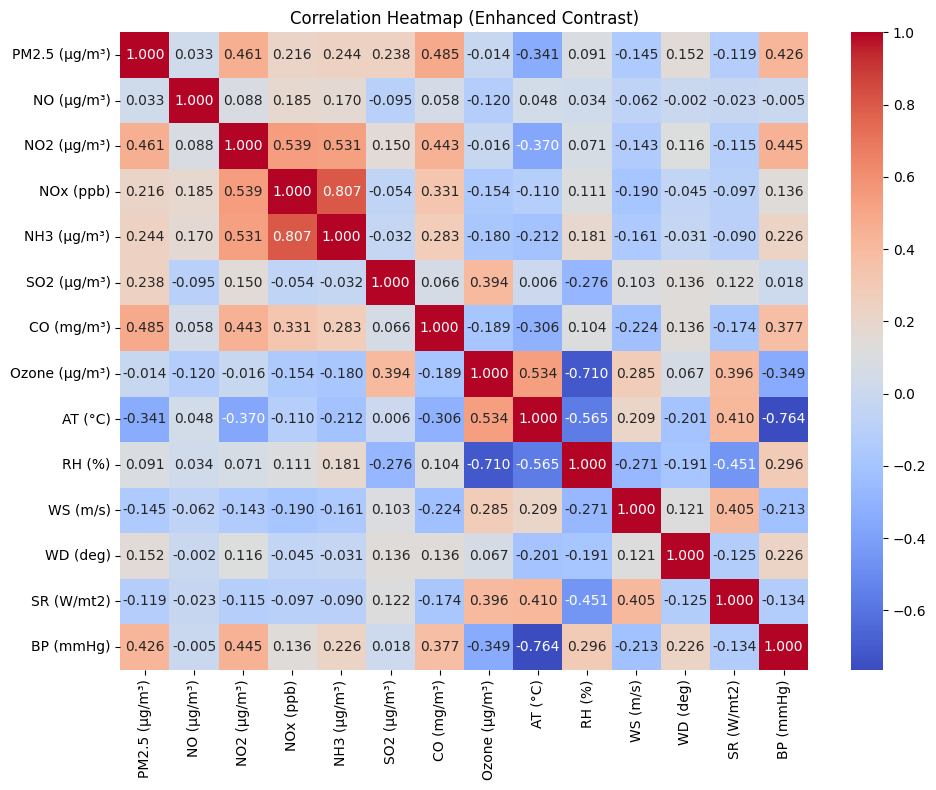

In [96]:
heatmap(gg)

In [97]:
null_sum(gg)

,column name,Null Count,Percent (%),Data Type,Non Null
S.No.,,,,,
1,Timestamp,0,0.00,object,8784
2,PM2.5 (µg/m³),48,0.55,float64,8736
3,NO (µg/m³),24,0.27,float64,8760
4,NO2 (µg/m³),24,0.27,float64,8760
5,NOx (ppb),24,0.27,float64,8760
6,NH3 (µg/m³),96,1.09,float64,8688
7,SO2 (µg/m³),216,2.46,float64,8568
8,CO (mg/m³),24,0.27,float64,8760
9,Ozone (µg/m³),24,0.27,float64,8760


In [98]:
gg_nn=gg.copy()

In [99]:
gg_nn=gg_nn.dropna(subset=['PM2.5 (µg/m³)'])

In [100]:
skewness(gg_nn)

PM2.5 (µg/m³): 3.209
NO (µg/m³): 24.987
NO2 (µg/m³): 1.890
NOx (ppb): 3.623
NH3 (µg/m³): 1.645
SO2 (µg/m³): -0.235
CO (mg/m³): 4.345
Ozone (µg/m³): 1.971
AT (°C): -0.403
RH (%): -0.139
WS (m/s): 1.475
WD (deg): -0.316
SR (W/mt2): 1.364
BP (mmHg): 0.406


In [101]:
null_sum(gg)

,column name,Null Count,Percent (%),Data Type,Non Null
S.No.,,,,,
1,Timestamp,0,0.00,object,8784
2,PM2.5 (µg/m³),48,0.55,float64,8736
3,NO (µg/m³),24,0.27,float64,8760
4,NO2 (µg/m³),24,0.27,float64,8760
5,NOx (ppb),24,0.27,float64,8760
6,NH3 (µg/m³),96,1.09,float64,8688
7,SO2 (µg/m³),216,2.46,float64,8568
8,CO (mg/m³),24,0.27,float64,8760
9,Ozone (µg/m³),24,0.27,float64,8760


In [102]:
gg_nn['NH3 (µg/m³)'] = gg_nn['NH3 (µg/m³)'].fillna(gg_nn['NH3 (µg/m³)']).interpolate()
gg_nn['SO2 (µg/m³)'] = gg_nn['SO2 (µg/m³)'].fillna(gg_nn['SO2 (µg/m³)']).interpolate()
gg_nn['RH (%)']= gg_nn['RH (%)'].fillna(gg_nn['RH (%)']).interpolate()

In [103]:
null_sum(gg_nn)

,column name,Null Count,Percent (%),Data Type,Non Null
S.No.,,,,,
1,Timestamp,0,0.0,object,8736
2,PM2.5 (µg/m³),0,0.0,float64,8736
3,NO (µg/m³),0,0.0,float64,8736
4,NO2 (µg/m³),0,0.0,float64,8736
5,NOx (ppb),0,0.0,float64,8736
6,NH3 (µg/m³),0,0.0,float64,8736
7,SO2 (µg/m³),0,0.0,float64,8736
8,CO (mg/m³),0,0.0,float64,8736
9,Ozone (µg/m³),0,0.0,float64,8736


In [104]:
gg_nn.to_csv('gg_nn.csv', index=False)

## 10)DH

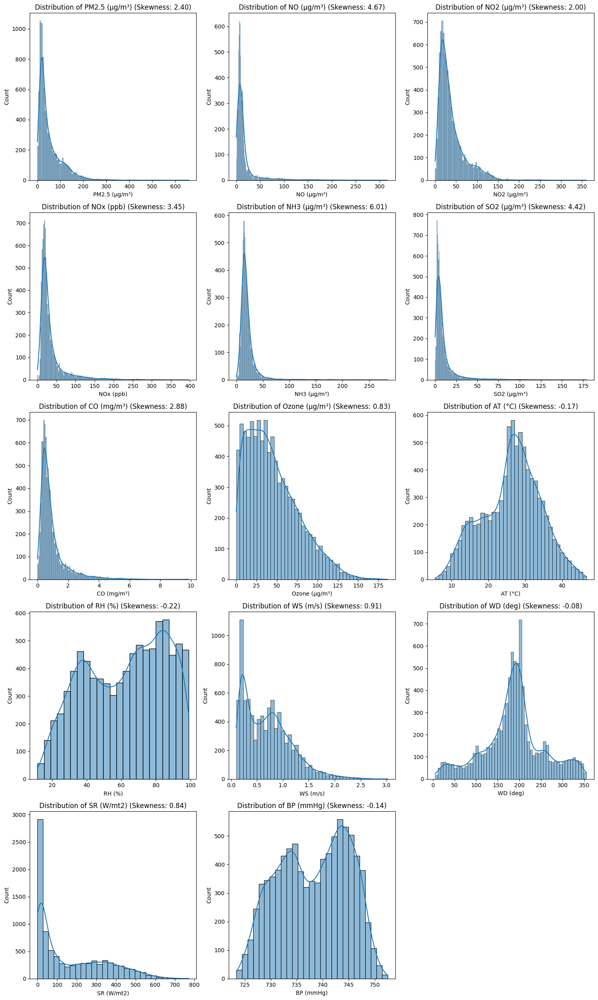

In [105]:
plot_with_skewness(dh)

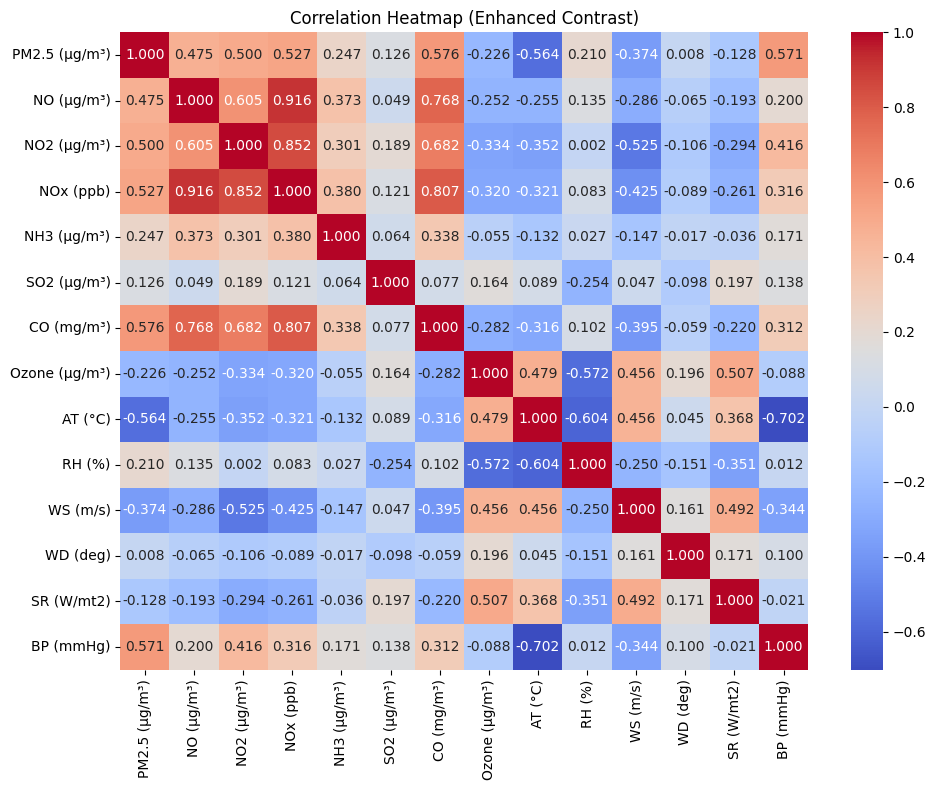

In [106]:
heatmap(dh)

only bp col has 24 missing values and rest have all the filled rows

In [107]:
dh_nn=dh.copy()

In [108]:
null_sum(dh_nn)

,column name,Null Count,Percent (%),Data Type,Non Null
S.No.,,,,,
1,Timestamp,0,0.00,object,8784
2,PM2.5 (µg/m³),0,0.00,float64,8784
3,NO (µg/m³),0,0.00,float64,8784
4,NO2 (µg/m³),0,0.00,float64,8784
5,NOx (ppb),0,0.00,float64,8784
6,NH3 (µg/m³),0,0.00,float64,8784
7,SO2 (µg/m³),0,0.00,float64,8784
8,CO (mg/m³),0,0.00,float64,8784
9,Ozone (µg/m³),0,0.00,float64,8784


In [109]:
dh_nn['BP (mmHg)'] = dh_nn['BP (mmHg)'].fillna(dh_nn['BP (mmHg)']).interpolate()

In [110]:
null_sum(dh_nn)

,column name,Null Count,Percent (%),Data Type,Non Null
S.No.,,,,,
1,Timestamp,0,0.0,object,8784
2,PM2.5 (µg/m³),0,0.0,float64,8784
3,NO (µg/m³),0,0.0,float64,8784
4,NO2 (µg/m³),0,0.0,float64,8784
5,NOx (ppb),0,0.0,float64,8784
6,NH3 (µg/m³),0,0.0,float64,8784
7,SO2 (µg/m³),0,0.0,float64,8784
8,CO (mg/m³),0,0.0,float64,8784
9,Ozone (µg/m³),0,0.0,float64,8784


In [111]:
skewness(dh_nn)

PM2.5 (µg/m³): 2.402
NO (µg/m³): 4.675
NO2 (µg/m³): 2.003
NOx (ppb): 3.446
NH3 (µg/m³): 6.013
SO2 (µg/m³): 4.416
CO (mg/m³): 2.885
Ozone (µg/m³): 0.832
AT (°C): -0.167
RH (%): -0.224
WS (m/s): 0.910
WD (deg): -0.082
SR (W/mt2): 0.841
BP (mmHg): -0.146


In [112]:
dh_nn.to_csv('dh_nn.csv', index=False)

#Analyzing Outliers

In [113]:
from scipy.stats import zscore
from scipy.stats.mstats import winsorize
from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import RobustScaler, StandardScaler

In [114]:
def skewness(df, exclude_col='Timestamp'):

    temp_df = df.drop(columns=[exclude_col], errors='ignore')
    skew_values = temp_df.skew()

    for col, skew in skew_values.items():
        print(f"{col}: {skew:.3f}")

In [115]:
def heatmap(df, exclude_col='Timestamp', figsize=(10, 8), cmap='coolwarm'):

    cleaned_df = df.drop(columns=[exclude_col], errors='ignore')

    corr_matrix = cleaned_df.corr()

    plt.figure(figsize=figsize)
    sns.heatmap(corr_matrix, annot=True, cmap=cmap, fmt=".3f")
    plt.title('Correlation Heatmap (Enhanced Contrast)')
    plt.tight_layout()
    plt.show()


In [116]:
def plot_with_skewness(df): # df: The pandas DataFrame to visualize.
    numeric_cols = df.select_dtypes(include=np.number).columns
    n_cols = 3  # Number of columns for subplots
    n_rows = (len(numeric_cols) + n_cols - 1) // n_cols  # Calculate number of rows needed
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, n_rows * 5))
    axes = axes.flatten()  # Flatten the 2D array of axes for easy iteration
    for i, col in enumerate(numeric_cols):
        sns.histplot(df[col].dropna(), kde=True, ax=axes[i])
        skewness = df[col].skew()
        axes[i].set_title(f'Distribution of {col} (Skewness: {skewness:.2f})')
    # Hide any unused subplots
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])
    plt.tight_layout()
    plt.show()

In [117]:
def boxplot(df, figsize=(12, 6), box_color='skyblue', rotate_xticks=30):
    fig, ax = plt.subplots(figsize=figsize)

    box = df.boxplot(ax=ax, patch_artist=True, return_type='dict')

    # Color the boxes
    for patch in box['boxes']:
        patch.set_facecolor(box_color)
        patch.set_edgecolor('black')
        patch.set_linewidth(2)

    # Axis labels and title
    plt.xlabel("Columns", fontsize=14, fontweight='bold', color='navy')
    plt.ylabel("Values", fontsize=14, fontweight='bold', color='navy')
    plt.title("Box Plot of All Columns", fontsize=16, fontweight='bold', color='darkred')
    plt.xticks(fontsize=12, color='darkblue', rotation=rotate_xticks)
    plt.yticks(fontsize=12, color='darkblue')

    # Grid lines
    plt.grid(axis='y', linestyle='--', color='gray')

    plt.tight_layout()
    plt.show()

In [118]:
def detect_outliers_iqr(df, exclude_col='Timestamp'):
    temp_df = df.drop(columns=[exclude_col], errors='ignore')
    Q1 = temp_df.quantile(0.25)
    Q3 = temp_df.quantile(0.75)
    IQR = Q3 - Q1

    outlier_mask = (temp_df < (Q1 - 1.5 * IQR)) | (temp_df > (Q3 + 1.5 * IQR))
    outlier_counts = outlier_mask.sum()
    non_null_counts = temp_df.notnull().sum()

    outlier_percentages = (outlier_counts / non_null_counts) * 100

    outlier_df = pd.DataFrame({
        'Outlier Count': outlier_counts,
        'Outlier %': outlier_percentages.round(2)
    }).sort_values(by='Outlier Count', ascending=False)

    return outlier_df

##1)amvt_nn

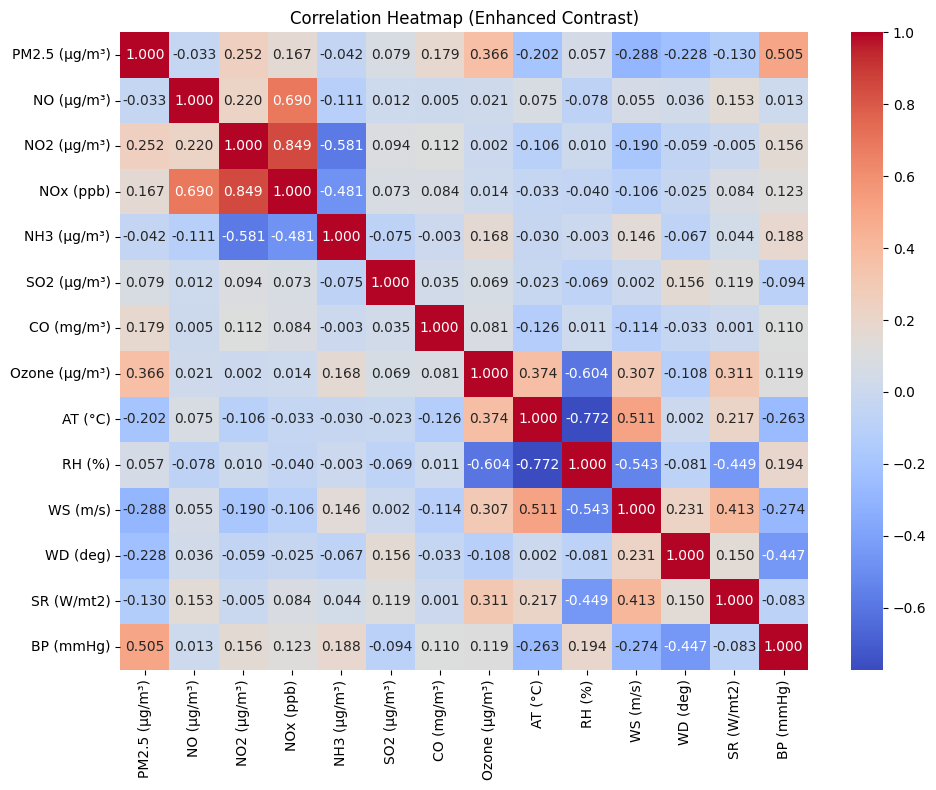

In [119]:
heatmap(amvt_nn)

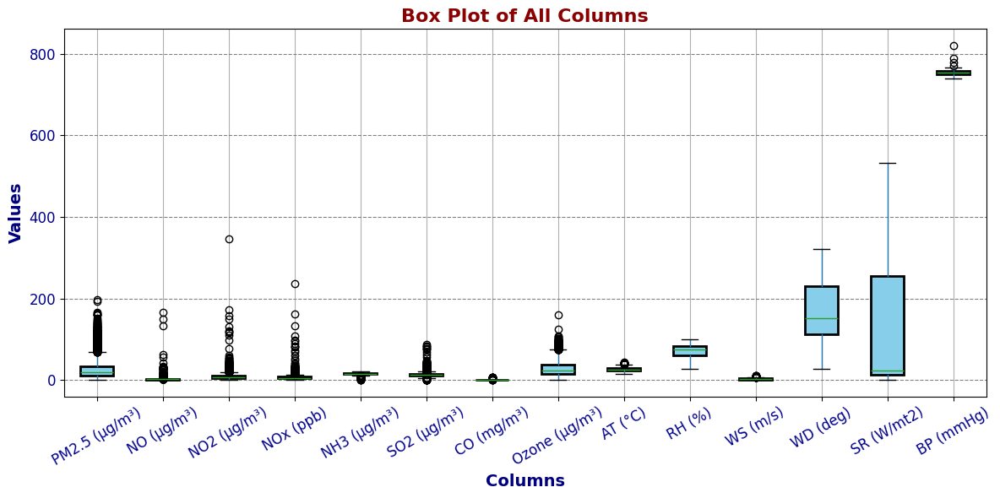

In [120]:
boxplot(amvt_nn)

In [121]:
skewness(amvt_nn)

PM2.5 (µg/m³): 1.857
NO (µg/m³): 23.287
NO2 (µg/m³): 12.509
NOx (ppb): 13.118
NH3 (µg/m³): -1.575
SO2 (µg/m³): 4.871
CO (mg/m³): 4.320
Ozone (µg/m³): 0.963
AT (°C): 0.363
RH (%): -0.503
WS (m/s): 0.746
WD (deg): 0.491
SR (W/mt2): 0.842
BP (mmHg): 0.247


In [122]:
detect_outliers_iqr(amvt_nn)

,Outlier Count,Outlier %
NOx (ppb),794,9.14
NO (µg/m³),656,7.55
NO2 (µg/m³),590,6.79
PM2.5 (µg/m³),570,6.56
NH3 (µg/m³),432,4.97
CO (mg/m³),359,4.13
SO2 (µg/m³),294,3.38
Ozone (µg/m³),165,1.90
AT (°C),62,0.71
WS (m/s),60,0.69


##2)av_nn

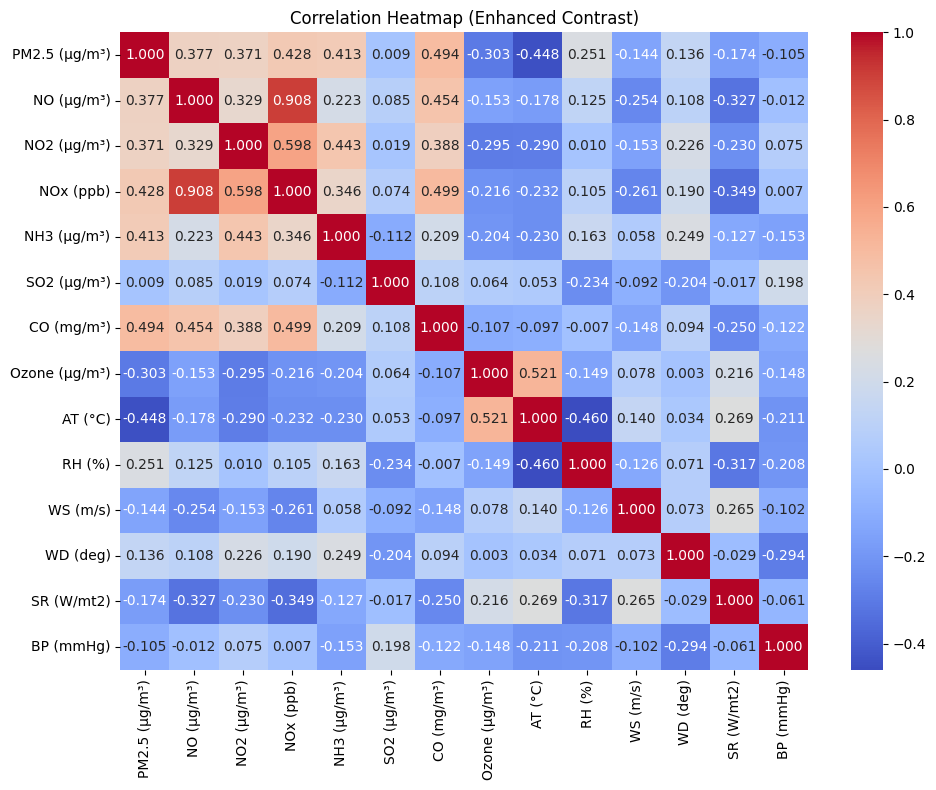

In [123]:
heatmap(av_nn)

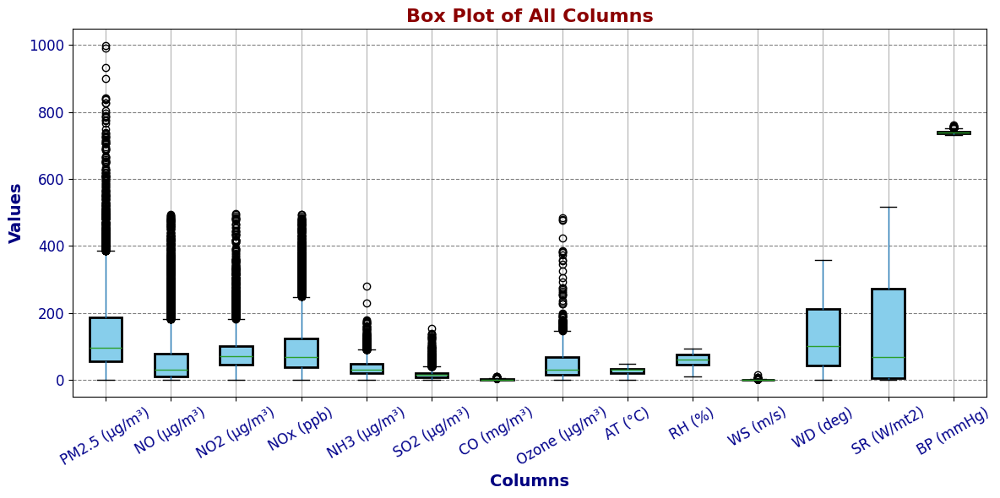

In [124]:
boxplot(av_nn)

In [125]:
skewness(av_nn)

PM2.5 (µg/m³): 1.957
NO (µg/m³): 2.300
NO2 (µg/m³): 2.409
NOx (ppb): 1.827
NH3 (µg/m³): 1.536
SO2 (µg/m³): 3.019
CO (mg/m³): 1.394
Ozone (µg/m³): 2.209
AT (°C): -0.574
RH (%): -0.049
WS (m/s): 3.723
WD (deg): 0.689
SR (W/mt2): 0.412
BP (mmHg): 1.215


In [126]:
detect_outliers_iqr(av_nn)

,Outlier Count,Outlier %
NO (µg/m³),741,9.22
WS (m/s),591,7.35
NOx (ppb),532,6.62
NO2 (µg/m³),373,4.64
PM2.5 (µg/m³),369,4.59
SO2 (µg/m³),346,4.30
CO (mg/m³),304,3.78
NH3 (µg/m³),299,3.72
BP (mmHg),104,1.29
Ozone (µg/m³),98,1.22


##3)bally_nn

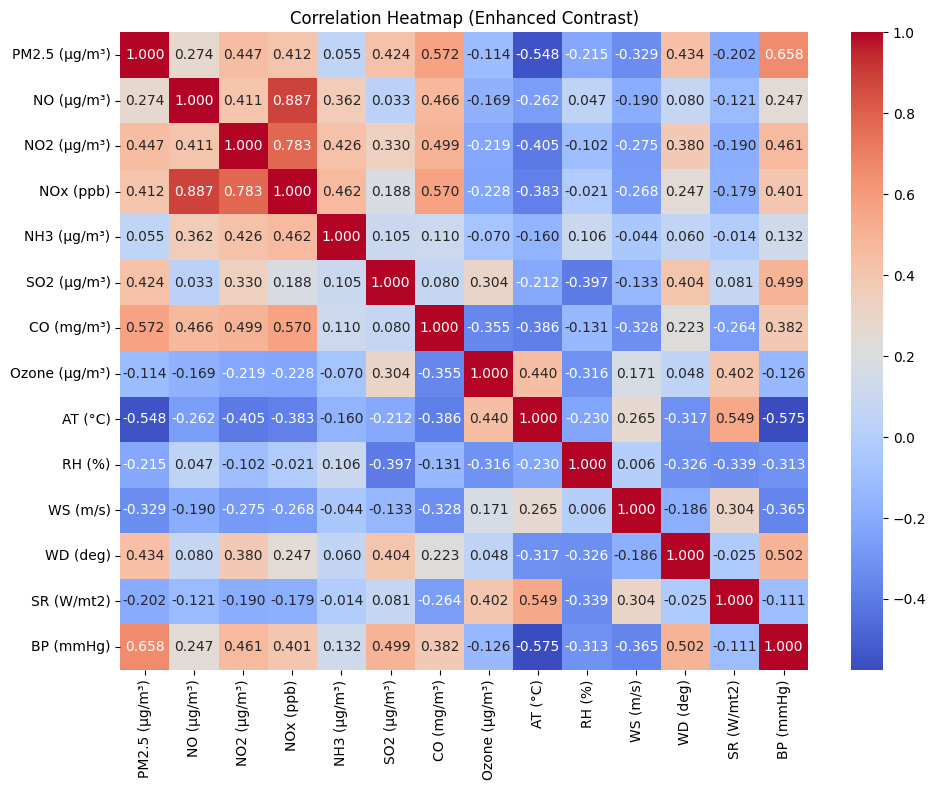

In [127]:
heatmap(bally_nn)

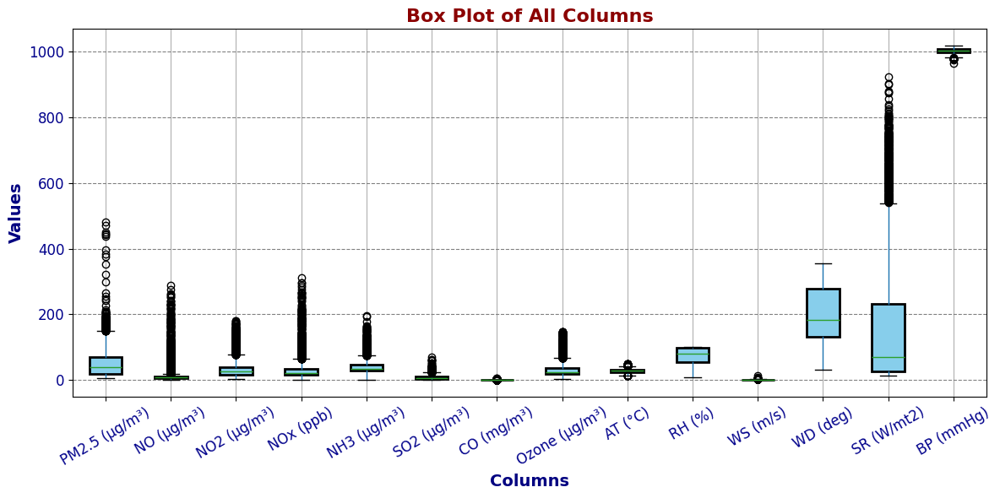

In [128]:
boxplot(bally_nn)

In [129]:
skewness(bally_nn)

PM2.5 (µg/m³): 1.941
NO (µg/m³): 5.817
NO2 (µg/m³): 2.146
NOx (ppb): 4.369
NH3 (µg/m³): 2.236
SO2 (µg/m³): 1.807
CO (mg/m³): 2.113
Ozone (µg/m³): 1.952
AT (°C): -0.011
RH (%): -0.610
WS (m/s): 2.113
WD (deg): 0.262
SR (W/mt2): 1.598
BP (mmHg): -0.265


In [130]:
detect_outliers_iqr(bally_nn)

,Outlier Count,Outlier %
NO (µg/m³),1273,14.49
Ozone (µg/m³),592,6.74
NO2 (µg/m³),567,6.45
CO (mg/m³),549,6.25
NOx (ppb),470,5.35
SR (W/mt2),457,5.20
SO2 (µg/m³),332,3.78
NH3 (µg/m³),304,3.46
WS (m/s),295,3.36
PM2.5 (µg/m³),190,2.16


##4)cps_nn

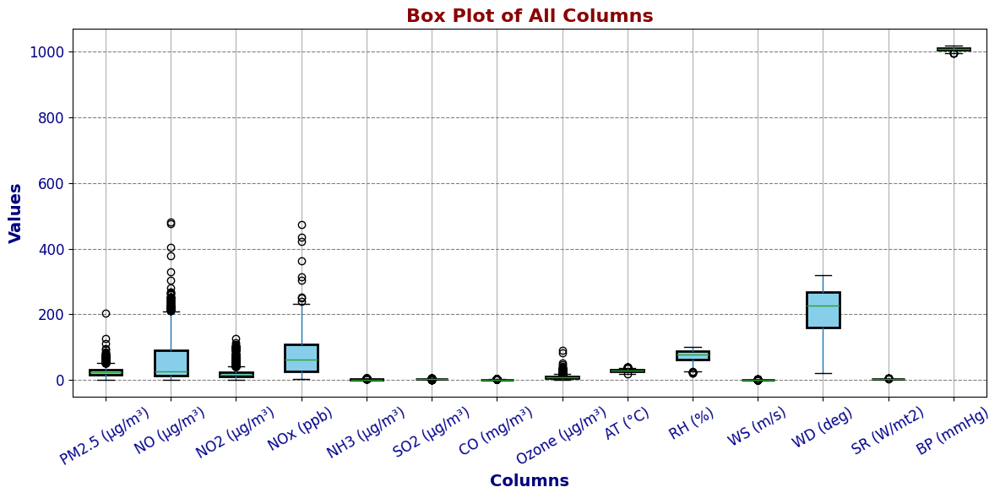

In [131]:
boxplot(cps_nn)

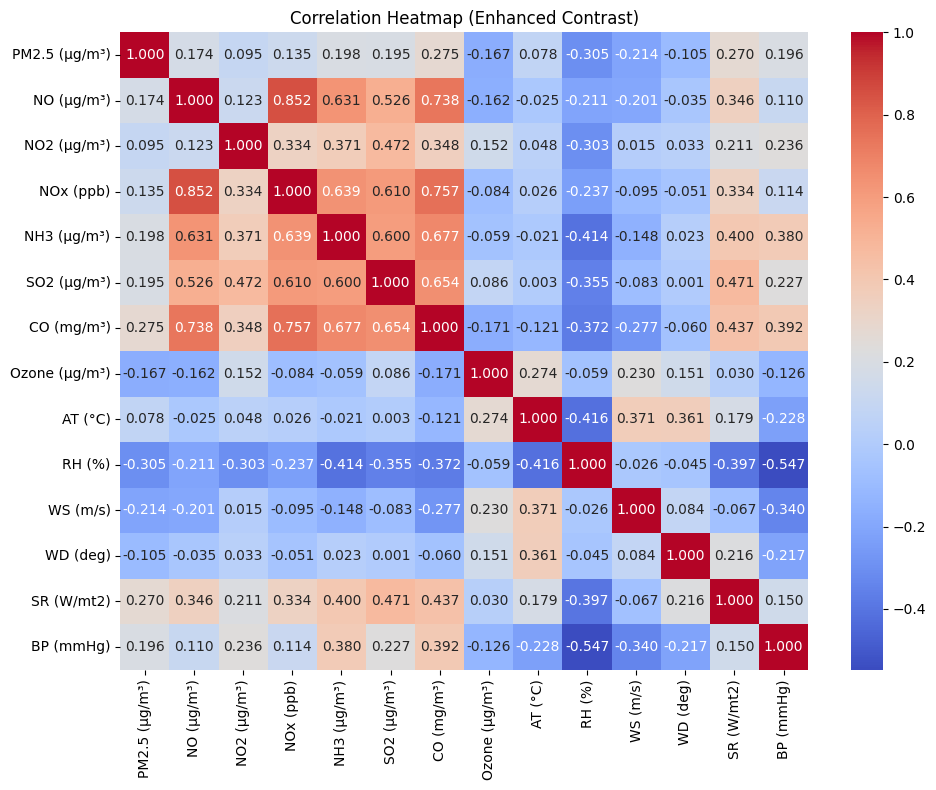

In [132]:
heatmap(cps_nn)

In [133]:
skewness(cps_nn)

PM2.5 (µg/m³): 1.549
NO (µg/m³): 1.210
NO2 (µg/m³): 2.144
NOx (ppb): 0.749
NH3 (µg/m³): 1.095
SO2 (µg/m³): 0.518
CO (mg/m³): 1.309
Ozone (µg/m³): 2.328
AT (°C): 0.223
RH (%): -0.485
WS (m/s): 1.496
WD (deg): -0.355
SR (W/mt2): 6.298
BP (mmHg): -0.145


In [134]:
detect_outliers_iqr(cps_nn)

,Outlier Count,Outlier %
Ozone (µg/m³),678,7.74
NO2 (µg/m³),440,5.02
CO (mg/m³),241,2.75
SO2 (µg/m³),176,2.01
PM2.5 (µg/m³),161,1.84
NH3 (µg/m³),105,1.20
WS (m/s),98,1.12
NO (µg/m³),67,0.76
AT (°C),29,0.33
SR (W/mt2),11,0.13


##5)dh_nn

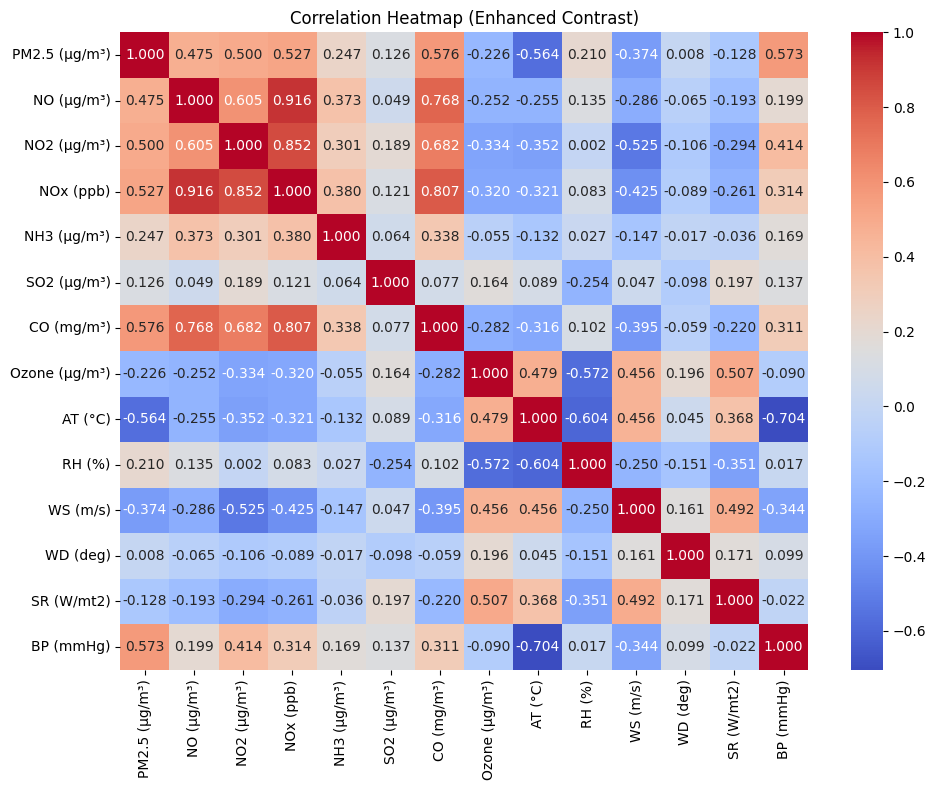

In [135]:
heatmap(dh_nn)

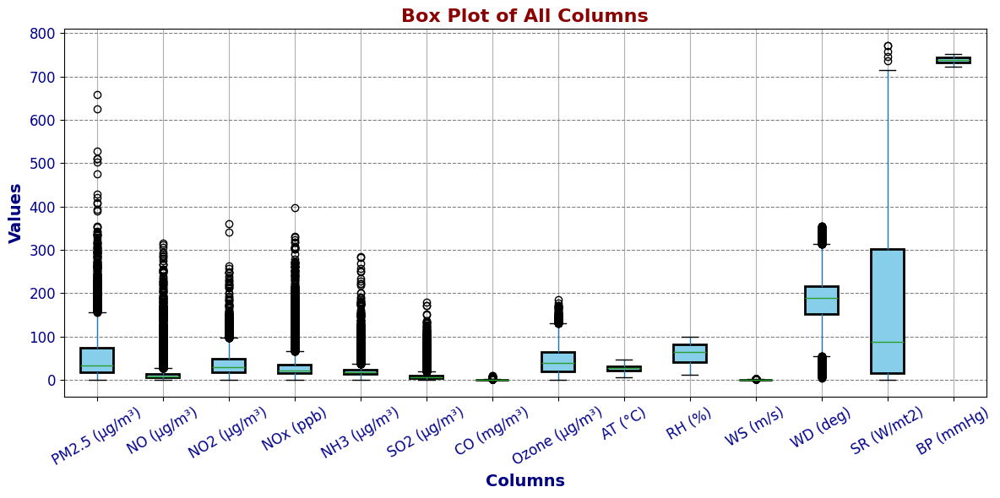

In [136]:
boxplot(dh_nn)

In [137]:
skewness(dh_nn)

PM2.5 (µg/m³): 2.402
NO (µg/m³): 4.675
NO2 (µg/m³): 2.003
NOx (ppb): 3.446
NH3 (µg/m³): 6.013
SO2 (µg/m³): 4.416
CO (mg/m³): 2.885
Ozone (µg/m³): 0.832
AT (°C): -0.167
RH (%): -0.224
WS (m/s): 0.910
WD (deg): -0.082
SR (W/mt2): 0.841
BP (mmHg): -0.146


In [138]:
detect_outliers_iqr(dh_nn)

,Outlier Count,Outlier %
NO (µg/m³),1039,11.83
WD (deg),978,11.13
NOx (ppb),946,10.77
SO2 (µg/m³),908,10.34
CO (mg/m³),809,9.21
NH3 (µg/m³),600,6.83
NO2 (µg/m³),593,6.75
PM2.5 (µg/m³),451,5.13
WS (m/s),100,1.14
Ozone (µg/m³),92,1.05


##6)gg_nn

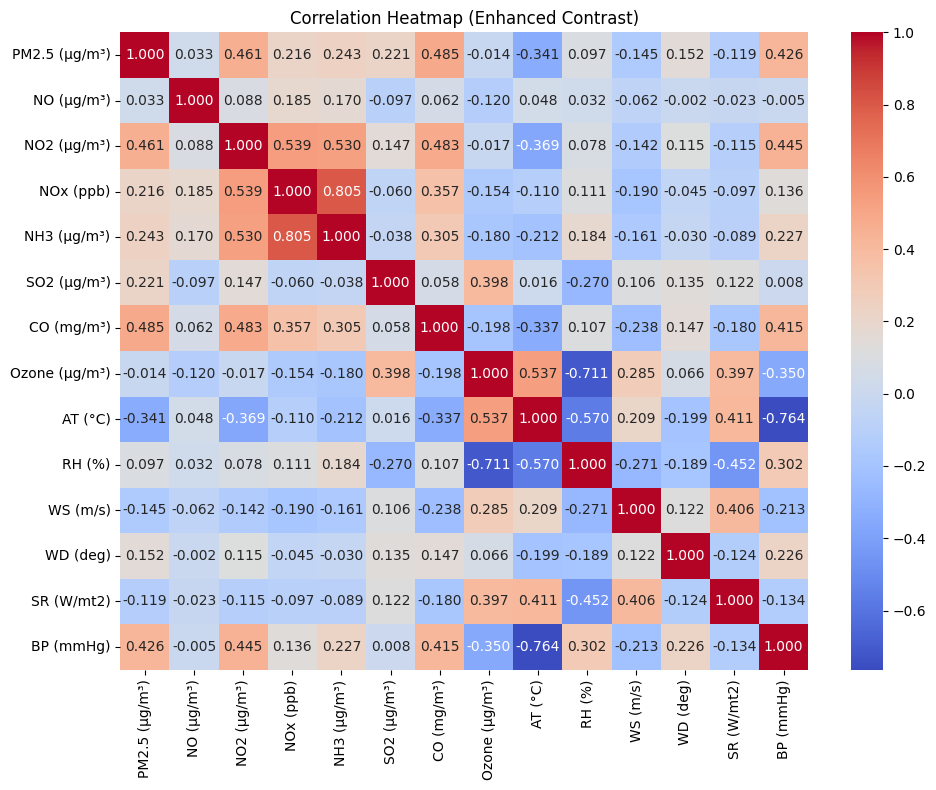

In [139]:
heatmap(gg_nn)

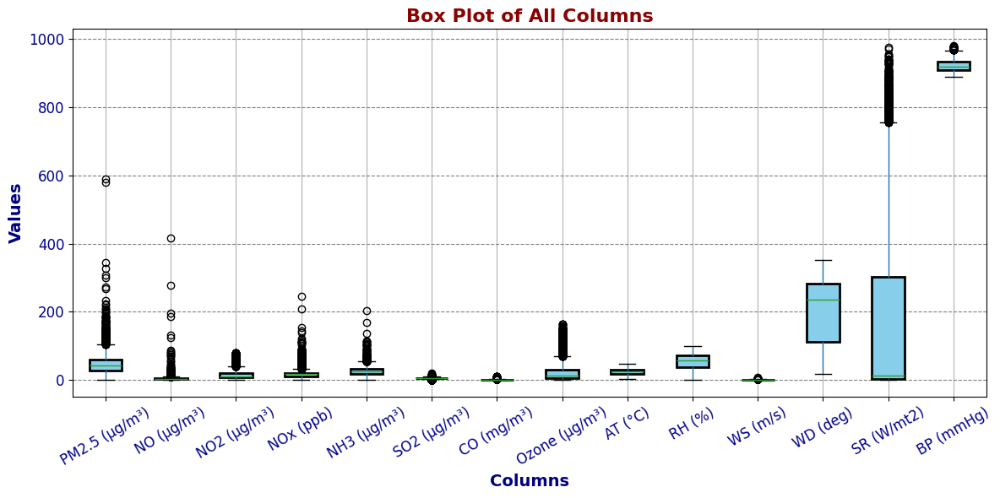

In [140]:
boxplot(gg_nn)

In [141]:
skewness(gg_nn)

PM2.5 (µg/m³): 3.209
NO (µg/m³): 24.987
NO2 (µg/m³): 1.890
NOx (ppb): 3.623
NH3 (µg/m³): 1.651
SO2 (µg/m³): -0.202
CO (mg/m³): 4.345
Ozone (µg/m³): 1.971
AT (°C): -0.403
RH (%): -0.142
WS (m/s): 1.475
WD (deg): -0.316
SR (W/mt2): 1.364
BP (mmHg): 0.406


In [142]:
detect_outliers_iqr(gg_nn)

,Outlier Count,Outlier %
NO (µg/m³),1015,11.62
NOx (ppb),887,10.15
NO2 (µg/m³),574,6.57
SO2 (µg/m³),475,5.44
Ozone (µg/m³),466,5.33
CO (mg/m³),421,4.82
SR (W/mt2),368,4.21
PM2.5 (µg/m³),283,3.24
NH3 (µg/m³),208,2.38
WS (m/s),178,2.04


##7)ic_nn

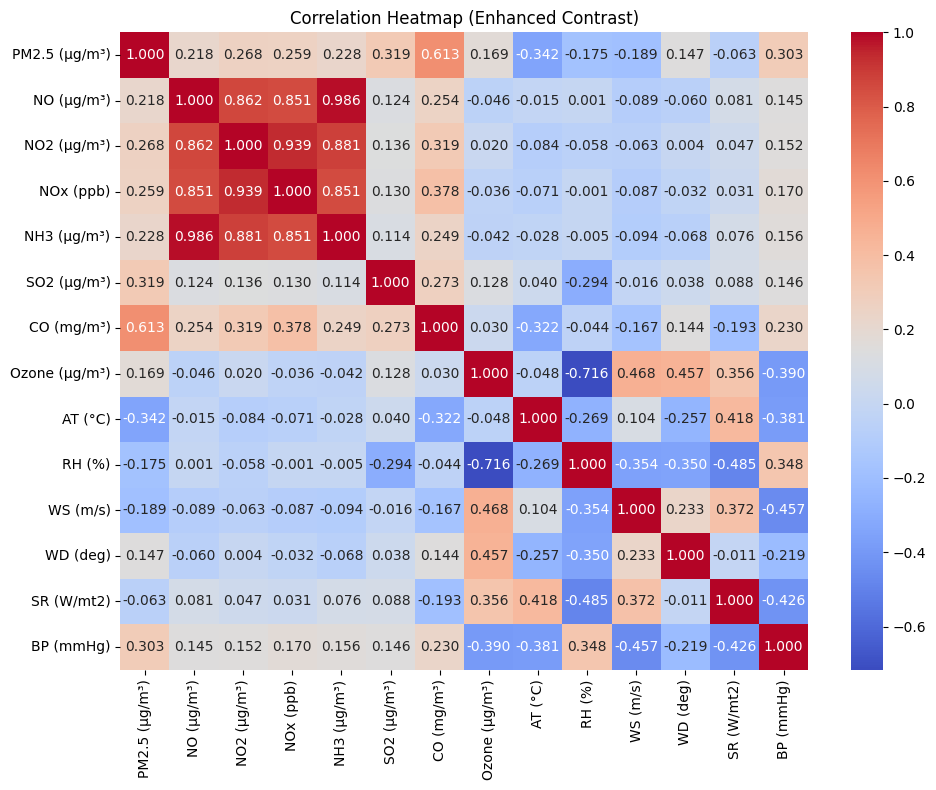

In [143]:
heatmap(ic_nn)

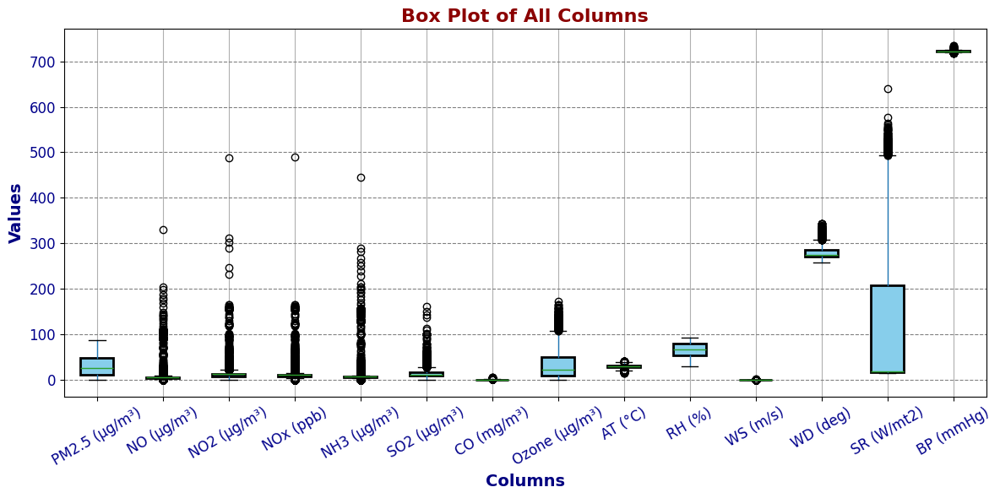

In [144]:
boxplot(ic_nn)

In [145]:
skewness(ic_nn)

PM2.5 (µg/m³): 0.694
NO (µg/m³): 9.504
NO2 (µg/m³): 10.427
NOx (ppb): 10.120
NH3 (µg/m³): 9.250
SO2 (µg/m³): 4.585
CO (mg/m³): 1.605
Ozone (µg/m³): 1.251
AT (°C): -0.545
RH (%): -0.235
WS (m/s): 1.399
WD (deg): 1.564
SR (W/mt2): 1.222
BP (mmHg): 0.997


In [146]:
detect_outliers_iqr(ic_nn)

,Outlier Count,Outlier %
NH3 (µg/m³),2593,29.76
NO (µg/m³),1758,20.18
NOx (ppb),1654,18.99
NO2 (µg/m³),775,8.90
BP (mmHg),613,7.04
WS (m/s),456,5.23
SO2 (µg/m³),417,4.79
CO (mg/m³),379,4.35
AT (°C),284,3.26
Ozone (µg/m³),255,2.93


##8)kp_nn

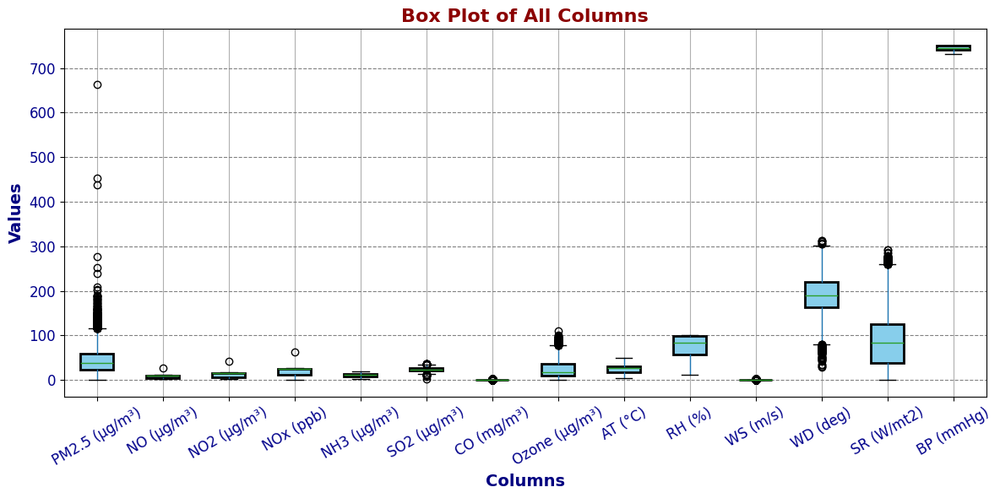

In [147]:
boxplot(kp_nn)

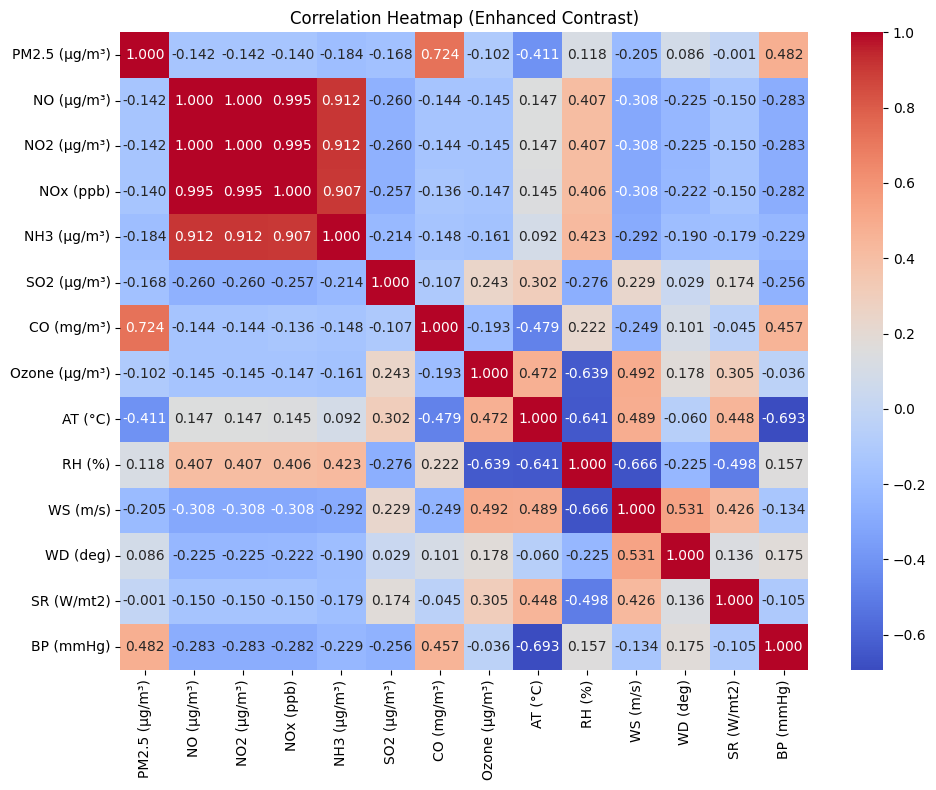

In [148]:
heatmap(kp_nn)

## 9)lg_nn

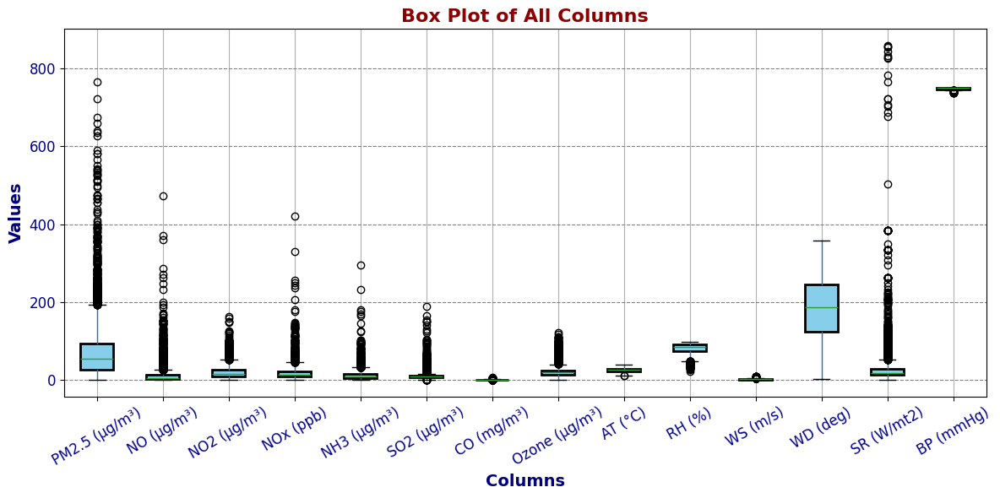

In [149]:
boxplot(lg_nn)

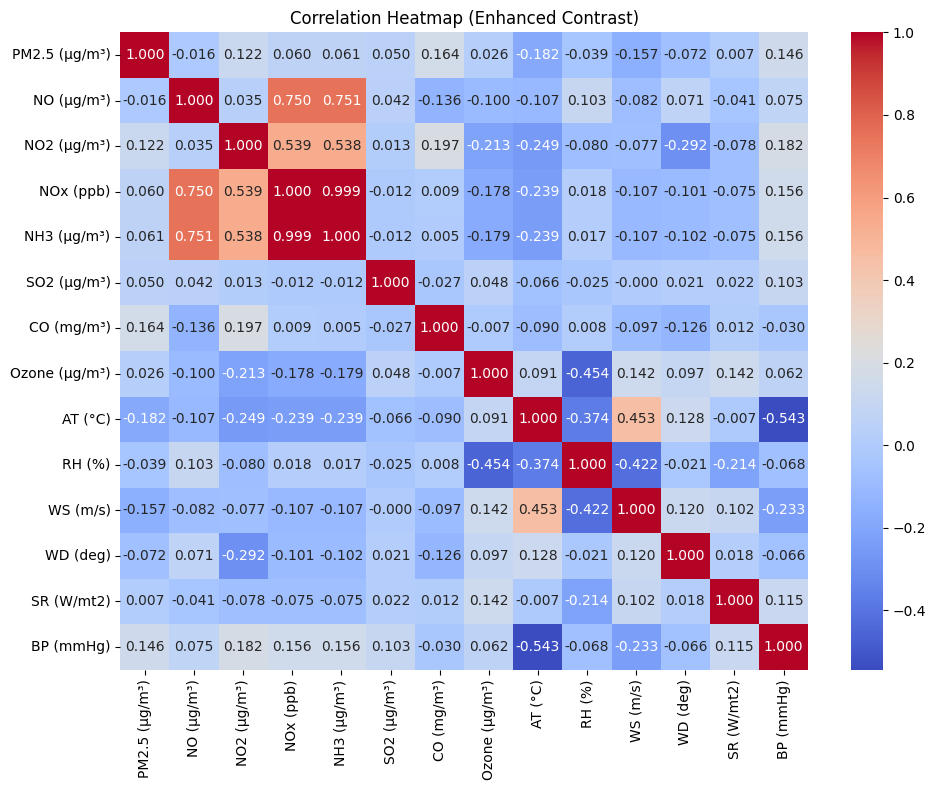

In [150]:
heatmap(lg_nn)

In [151]:
# lg_nn_processed = lg_nn.copy()

## 10)pl_nn

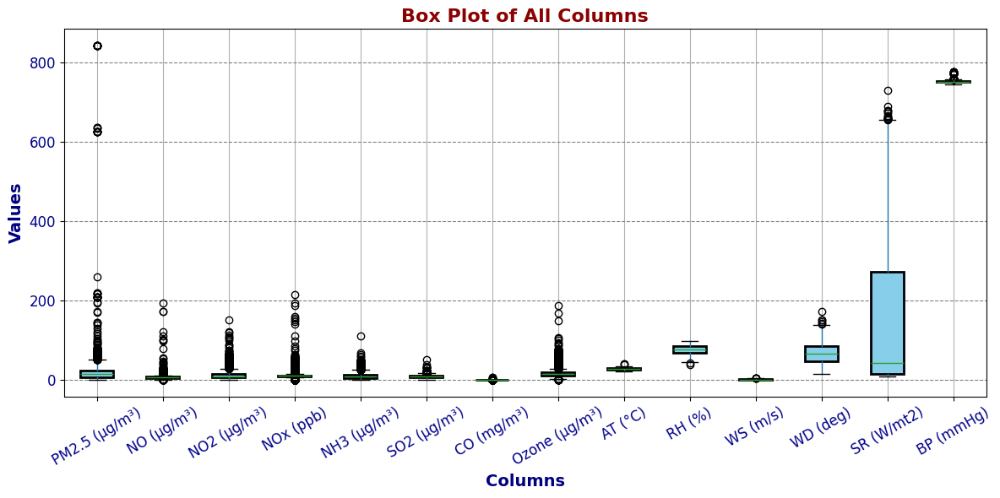

In [152]:
boxplot(pl_nn)

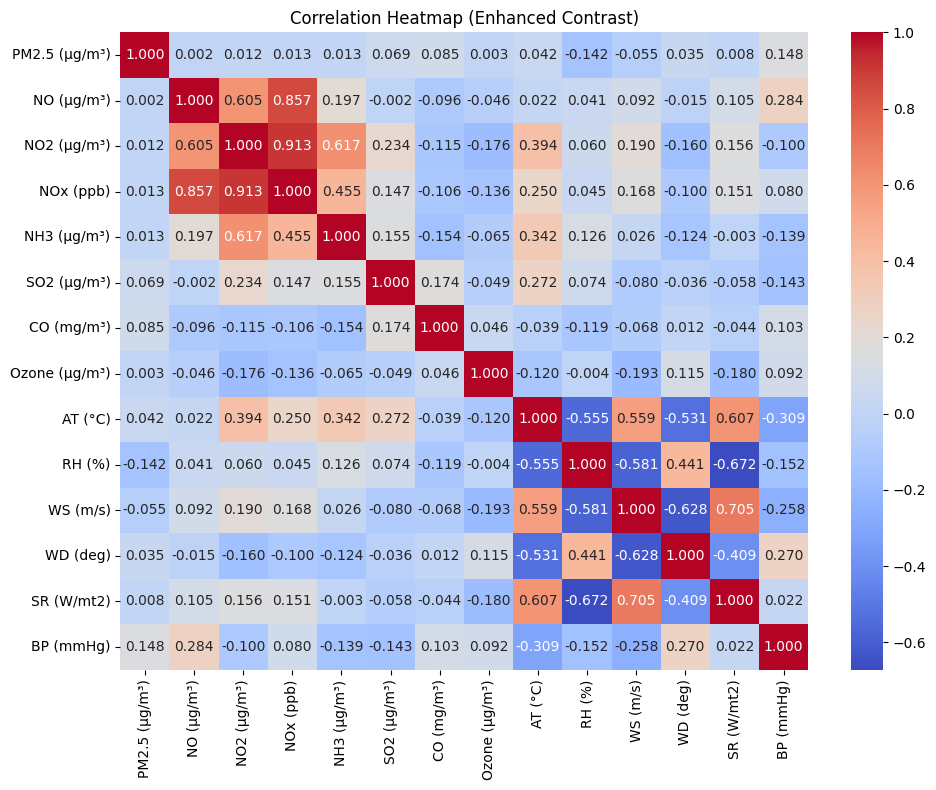

In [153]:
heatmap(pl_nn)

In [154]:
# pl_nn_processed = pl_nn.copy()

In [155]:
detect_outliers_iqr(pl_nn)

,Outlier Count,Outlier %
NOx (ppb),2016,23.53
NO2 (µg/m³),811,9.47
NO (µg/m³),596,6.96
Ozone (µg/m³),500,5.84
NH3 (µg/m³),364,4.25
CO (mg/m³),266,3.10
PM2.5 (µg/m³),185,2.16
SO2 (µg/m³),73,0.85
BP (mmHg),30,0.35
SR (W/mt2),17,0.20


## All data combine

In [156]:

dfs = [amvt_nn, av_nn, bally_nn, cps_nn, dh_nn, gg_nn, ic_nn, kp_nn, lg_nn, pl_nn]

combined_df = pd.concat(dfs, ignore_index=True)

In [157]:
combined_df

,Timestamp,PM2.5 (µg/m³),NO (µg/m³),NO2 (µg/m³),NOx (ppb),NH3 (µg/m³),SO2 (µg/m³),CO (mg/m³),Ozone (µg/m³),AT (°C),RH (%),WS (m/s),WD (deg),SR (W/mt2),BP (mmHg)
0,2024-01-01 00:00:00,166.25,1.10,17.80,10.35,13.98,13.70,1.06,8.78,21.02,97.00,0.70,251.25,13.0,761.00
1,2024-01-01 01:00:00,160.50,2.10,14.22,9.28,15.15,14.10,0.94,10.55,21.42,96.25,0.62,240.25,13.0,760.75
2,2024-01-01 02:00:00,138.00,0.93,12.45,7.05,16.10,13.85,0.87,13.05,21.50,96.50,0.48,191.25,13.0,760.00
3,2024-01-01 03:00:00,130.00,2.25,10.85,7.62,16.32,14.70,0.92,12.60,21.48,97.50,0.75,286.75,13.0,760.00
4,2024-01-01 04:00:00,128.00,1.80,8.90,6.20,16.73,14.15,0.82,10.40,21.08,98.50,0.35,209.25,13.0,760.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
86563,2024-12-31 19:00:00,31.67,5.90,21.53,16.27,9.50,12.03,0.67,13.40,30.90,63.33,0.80,40.00,37.0,752.67
86564,2024-12-31 20:00:00,32.50,5.32,25.42,17.88,8.70,15.02,0.72,11.22,30.78,64.25,0.42,43.25,37.0,753.00
86565,2024-12-31 21:00:00,31.00,3.67,17.67,12.37,9.93,16.00,0.73,15.40,30.57,63.67,0.40,48.67,37.0,754.00
86566,2024-12-31 22:00:00,23.00,3.78,15.30,11.22,15.38,17.02,0.64,11.48,30.02,63.00,0.90,49.50,37.0,753.75


In [158]:
coordinates = {
    'ic_nn': {'latitude': 17.51, 'longitude': 78.27},
    'pl_nn': {'latitude': 8.49, 'longitude': 76.95},
    'av_nn': {'latitude': 28.650218, 'longitude': 77.302706},
    'amvt_nn': {'latitude': 16.526526, 'longitude': 80.510951},
    'cps_nn': {'latitude': 19.0886993, 'longitude': 72.867897},
    'bally_nn': {'latitude': 22.5367507, 'longitude': 88.3638022},
    'kp_nn': {'latitude': 26.6719, 'longitude': 80.9858},
    'lg_nn': {'latitude': 26.1061, 'longitude': 91.5858},
    'gg_nn': {'latitude': 26.4499, 'longitude': 80.3319},
    'dh_nn': {'latitude': 24.6324, 'longitude': 76.1075}
}


In [159]:
ic_nn['Station'] = 'ic_nn'
pl_nn['Station'] = 'pl_nn'
av_nn['Station'] = 'av_nn'
amvt_nn['Station'] = 'amvt_nn'
cps_nn['Station'] = 'cps_nn'
bally_nn['Station'] = 'bally_nn'
kp_nn['Station'] = 'kp_nn'
lg_nn['Station'] = 'lg_nn'
gg_nn['Station'] = 'gg_nn'
dh_nn['Station'] = 'dh_nn'


# Combine all
df_all_nn = pd.concat([ic_nn, pl_nn, av_nn, amvt_nn, cps_nn, bally_nn,
                       kp_nn, lg_nn, gg_nn, dh_nn], ignore_index=True)

In [160]:
df_all_nn.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 86568 entries, 0 to 86567
Data columns (total 16 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Timestamp      86568 non-null  object 
 1   PM2.5 (µg/m³)  86568 non-null  float64
 2   NO (µg/m³)     86568 non-null  float64
 3   NO2 (µg/m³)    86568 non-null  float64
 4   NOx (ppb)      86568 non-null  float64
 5   NH3 (µg/m³)    86568 non-null  float64
 6   SO2 (µg/m³)    86568 non-null  float64
 7   CO (mg/m³)     86568 non-null  float64
 8   Ozone (µg/m³)  86568 non-null  float64
 9   AT (°C)        86568 non-null  float64
 10  RH (%)         86568 non-null  float64
 11  WS (m/s)       86568 non-null  float64
 12  WD (deg)       86568 non-null  float64
 13  SR (W/mt2)     86568 non-null  float64
 14  BP (mmHg)      86568 non-null  float64
 15  Station        86568 non-null  object 
dtypes: float64(14), object(2)
memory usage: 10.6+ MB


In [161]:

df_all_nn['Latitude'] = df_all_nn['Station'].map(lambda x: coordinates[x]['latitude'])
df_all_nn['Longitude'] = df_all_nn['Station'].map(lambda x: coordinates[x]['longitude'])


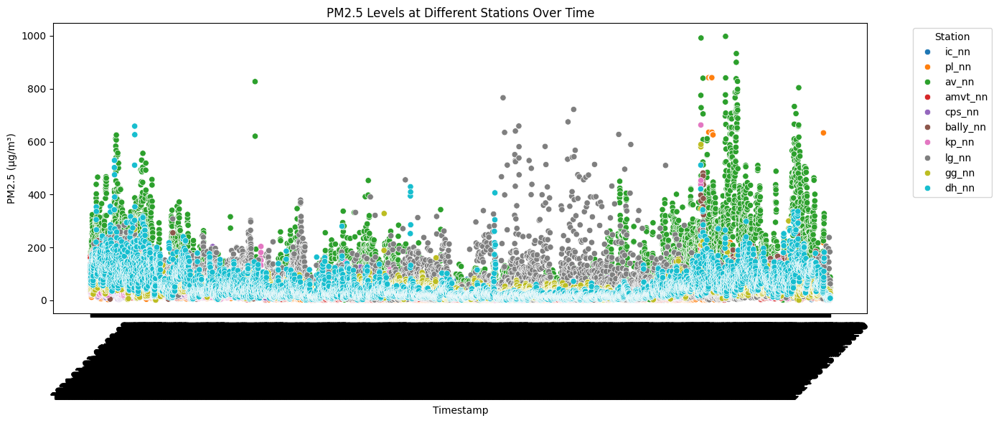

In [162]:
plt.figure(figsize=(14, 6))
sns.scatterplot(data=df_all_nn, x='Timestamp', y='PM2.5 (µg/m³)', hue='Station', palette='tab10')

plt.title('PM2.5 Levels at Different Stations Over Time')
plt.xlabel('Timestamp')
plt.ylabel('PM2.5 (µg/m³)')
plt.xticks(rotation=45)
plt.legend(title='Station', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

Enter day (1-31): 26
Enter month (1-12): 6


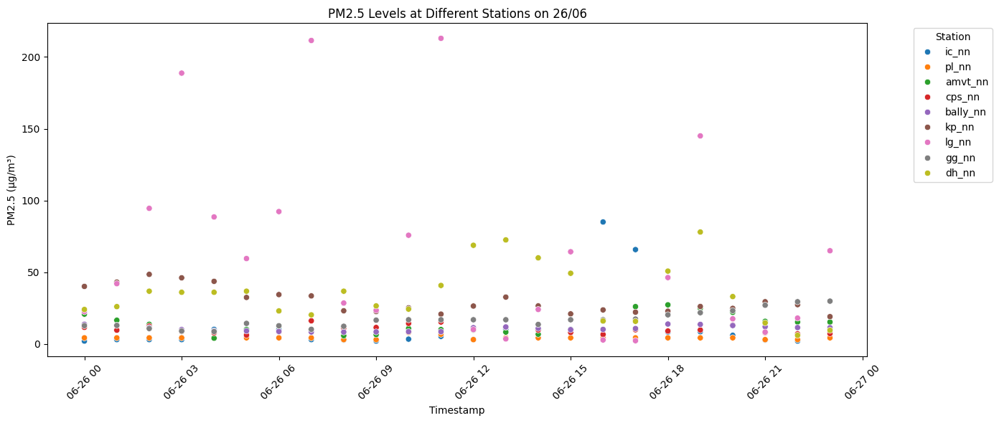

In [163]:

day = int(input("Enter day (1-31): "))
month = int(input("Enter month (1-12): "))


df_all_nn['Timestamp'] = pd.to_datetime(df_all_nn['Timestamp'])

#  Filter  the specific day
filtered_df = df_all_nn[(df_all_nn['Timestamp'].dt.day == day) &
                        (df_all_nn['Timestamp'].dt.month == month)]


if filtered_df.empty:
    print(f"No PM2.5 data found for {day:02d}/{month:02d}.")
else:
    #  Plot the scatterplot
    plt.figure(figsize=(14, 6))
    sns.scatterplot(data=filtered_df, x='Timestamp', y='PM2.5 (µg/m³)', hue='Station',palette="tab10")

    plt.title(f'PM2.5 Levels at Different Stations on {day:02d}/{month:02d}')
    plt.xlabel('Timestamp')
    plt.ylabel('PM2.5 (µg/m³)')
    plt.xticks(rotation=45)
    plt.legend(title='Station', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()


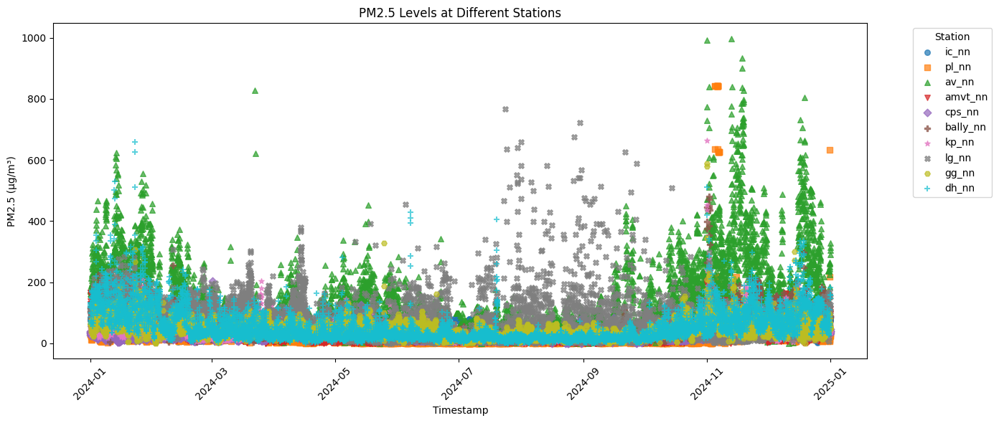

In [164]:
plt.figure(figsize=(14, 6))

#  each station with a unique color + marker
stations = df_all_nn['Station'].unique()
markers = ['o', 's', '^', 'v', 'D', 'P', '*', 'X', 'H', '+']

for i, station in enumerate(stations):
    station_data = df_all_nn[df_all_nn['Station'] == station]
    plt.scatter(
        station_data['Timestamp'],
        station_data['PM2.5 (µg/m³)'],
        label=station,
        marker=markers[i % len(markers)],
        s=30,
        alpha=0.7
    )

plt.title("PM2.5 Levels at Different Stations")
plt.xlabel("Timestamp")
plt.ylabel("PM2.5 (µg/m³)")
plt.xticks(rotation=45)
plt.legend(title="Station", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

In [165]:
df_all= df_all_nn.copy().drop(columns=['Station'])

In [166]:
df_all.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 86568 entries, 0 to 86567
Data columns (total 17 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Timestamp      86568 non-null  datetime64[ns]
 1   PM2.5 (µg/m³)  86568 non-null  float64       
 2   NO (µg/m³)     86568 non-null  float64       
 3   NO2 (µg/m³)    86568 non-null  float64       
 4   NOx (ppb)      86568 non-null  float64       
 5   NH3 (µg/m³)    86568 non-null  float64       
 6   SO2 (µg/m³)    86568 non-null  float64       
 7   CO (mg/m³)     86568 non-null  float64       
 8   Ozone (µg/m³)  86568 non-null  float64       
 9   AT (°C)        86568 non-null  float64       
 10  RH (%)         86568 non-null  float64       
 11  WS (m/s)       86568 non-null  float64       
 12  WD (deg)       86568 non-null  float64       
 13  SR (W/mt2)     86568 non-null  float64       
 14  BP (mmHg)      86568 non-null  float64       
 15  Latitude       8656

In [167]:
df_all.to_csv('df_all.csv', index=False)

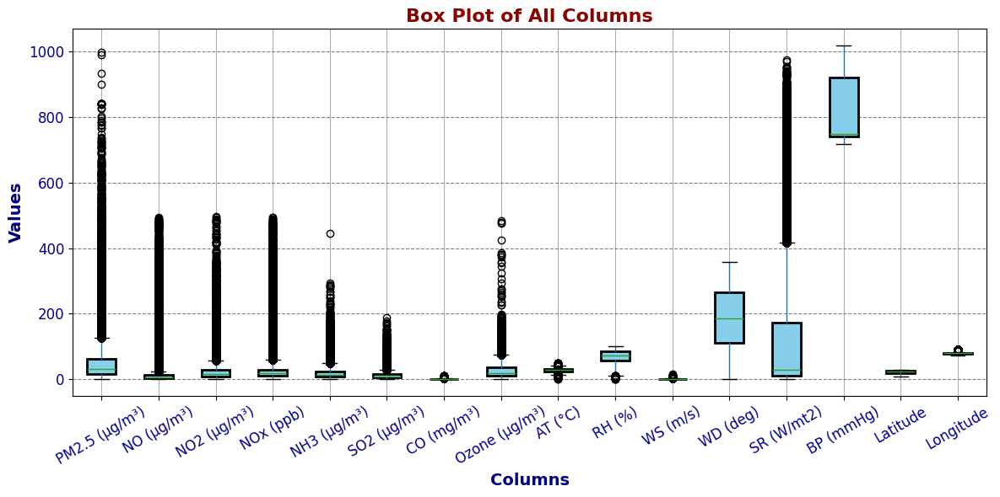

In [168]:
boxplot(df_all)

In [169]:
df_all.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 86568 entries, 0 to 86567
Data columns (total 17 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Timestamp      86568 non-null  datetime64[ns]
 1   PM2.5 (µg/m³)  86568 non-null  float64       
 2   NO (µg/m³)     86568 non-null  float64       
 3   NO2 (µg/m³)    86568 non-null  float64       
 4   NOx (ppb)      86568 non-null  float64       
 5   NH3 (µg/m³)    86568 non-null  float64       
 6   SO2 (µg/m³)    86568 non-null  float64       
 7   CO (mg/m³)     86568 non-null  float64       
 8   Ozone (µg/m³)  86568 non-null  float64       
 9   AT (°C)        86568 non-null  float64       
 10  RH (%)         86568 non-null  float64       
 11  WS (m/s)       86568 non-null  float64       
 12  WD (deg)       86568 non-null  float64       
 13  SR (W/mt2)     86568 non-null  float64       
 14  BP (mmHg)      86568 non-null  float64       
 15  Latitude       8656

In [170]:
# saving the dataframe
df_all.to_csv('airqual_all.csv' , index=False)

# Training

In [171]:
!pip install catboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.2/99.2 MB 8.6 MB/s eta 0:00:00


In [172]:
# PM2.5 Prediction Pipeline


import pandas as pd
import numpy as np

from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import mean_squared_error, r2_score, accuracy_score, classification_report
from imblearn.combine import SMOTETomek

import xgboost as xgb
import lightgbm as lgb
from catboost import CatBoostRegressor, CatBoostClassifier
from sklearn.ensemble import VotingClassifier

# Load Data

df = pd.read_csv("airqual_all.csv")
df["Timestamp"] = pd.to_datetime(df["Timestamp"], errors='coerce') # Added errors='coerce'

# Feature Engineering
df.dropna(subset=["Timestamp"], inplace=True)

df["year"] = df["Timestamp"].dt.year
df["month"] = df["Timestamp"].dt.month
df["day"] = df["Timestamp"].dt.day
df["dayofweek"] = df["Timestamp"].dt.dayofweek
df["hour"] = df["Timestamp"].dt.hour

# Cyclical encoding for time
df["month_sin"] = np.sin(2 * np.pi * df["month"]/12)
df["month_cos"] = np.cos(2 * np.pi * df["month"]/12)
df["hour_sin"] = np.sin(2 * np.pi * df["hour"]/24)
df["hour_cos"] = np.cos(2 * np.pi * df["hour"]/24)

# Lag features
df["pm25_lag1"] = df["PM2.5 (µg/m³)"].shift(1)
df["pm25_lag3"] = df["PM2.5 (µg/m³)"].shift(3)

# Rolling averages
df["pm25_roll_3h"] = df["PM2.5 (µg/m³)"].rolling(window=3).mean().shift(1)
df["pm25_roll_24h"] = df["PM2.5 (µg/m³)"].rolling(window=24).mean().shift(1)

# Drop NaN rows created by shifting and any remaining NaNs
df.dropna(inplace=True)


# Define features and targets
features = [col for col in df.columns if col not in ["Timestamp", "PM2.5 (µg/m³)", "AQI_Category"]]
X = df[features]
y_reg = df["PM2.5 (µg/m³)"]

# Classification target
def categorize_pm25(value):
    if value <= 30:
        return "Good"
    elif value <= 60:
        return "Satisfactory"
    elif value <= 90:
        return "Moderate"
    elif value <= 120:
        return "Poor"
    elif value <= 250:
        return "Very Poor"
    else:
        return "Severe"

df["AQI_Category"] = df["PM2.5 (µg/m³)"].apply(categorize_pm25)
y_cls = df["AQI_Category"]

# Encode classification labels
le = LabelEncoder()
y_cls_encoded = le.fit_transform(y_cls)


# Train/Test Split
X_train, X_test, y_train_reg, y_test_reg = train_test_split(
    X, y_reg, test_size=0.2, random_state=42
)
X_train_cls, X_test_cls, y_train_cls, y_test_cls = train_test_split(
    X, y_cls_encoded, test_size=0.2, random_state=42, stratify=y_cls_encoded
)

# Scale features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

X_train_cls_scaled = scaler.fit_transform(X_train_cls)
X_test_cls_scaled = scaler.transform(X_test_cls)

# Handle Imbalance (SMOTE-Tomek)
smt = SMOTETomek(random_state=42)
X_train_cls_bal, y_train_cls_bal = smt.fit_resample(X_train_cls_scaled, y_train_cls)

# Regression Models
print("\n===== REGRESSION =====")

xgb_reg = xgb.XGBRegressor(
    random_state=42, n_estimators=300, learning_rate=0.05, max_depth=8,
    tree_method="hist"   # Fast CPU method
)
xgb_reg.fit(X_train_scaled, y_train_reg)
y_pred_xgb = xgb_reg.predict(X_test_scaled)

lgb_reg = lgb.LGBMRegressor(
    random_state=42, n_estimators=300, learning_rate=0.05, max_depth=-1
)
lgb_reg.fit(X_train_scaled, y_train_reg)
y_pred_lgb = lgb_reg.predict(X_test_scaled)

cat_reg = CatBoostRegressor(
    verbose=0, random_state=42, iterations=300, learning_rate=0.05, depth=8
)
cat_reg.fit(X_train_scaled, y_train_reg)
y_pred_cat = cat_reg.predict(X_test_scaled)

print("XGB R²:", r2_score(y_test_reg, y_pred_xgb))
print("LightGBM R²:", r2_score(y_test_reg, y_pred_lgb))
print("CatBoost R²:", r2_score(y_test_reg, y_pred_cat))


# Classification Models (Quick Hyperparameter Search)
print("\n===== CLASSIFICATION =====")

# XGBoost
param_dist_xgb = {
    "n_estimators": [200, 300],
    "max_depth": [4, 6, 8],
    "learning_rate": [0.01, 0.05, 0.1],
    "subsample": [0.8, 1],
    "colsample_bytree": [0.8, 1]
}
xgb_search = RandomizedSearchCV(
    xgb.XGBClassifier(random_state=42, eval_metric="mlogloss", tree_method="hist"),
    param_distributions=param_dist_xgb,
    n_iter=5, cv=3, scoring="accuracy", n_jobs=-1, verbose=1
)
xgb_search.fit(X_train_cls_bal, y_train_cls_bal)
xgb_best = xgb_search.best_estimator_

# LightGBM
param_dist_lgb = {
    "n_estimators": [200, 300],
    "max_depth": [-1, 6, 8],
    "learning_rate": [0.01, 0.05, 0.1],
    "subsample": [0.8, 1],
    "colsample_bytree": [0.8, 1]
}
lgb_search = RandomizedSearchCV(
    lgb.LGBMClassifier(random_state=42),
    param_distributions=param_dist_lgb,
    n_iter=5, cv=3, scoring="accuracy", n_jobs=-1, verbose=1
)
lgb_search.fit(X_train_cls_bal, y_train_cls_bal)
lgb_best = lgb_search.best_estimator_

# CatBoost (manual tuning, CPU)
cat_cls = CatBoostClassifier(
    verbose=0, random_state=42, iterations=300, learning_rate=0.05, depth=8
)
cat_cls.fit(X_train_cls_bal, y_train_cls_bal)

# -------------------------------
# Ensemble Voting Classifier
# -------------------------------
voting_clf = VotingClassifier(
    estimators=[("xgb", xgb_best), ("lgb", lgb_best), ("cat", cat_cls)],
    voting="soft"
)
voting_clf.fit(X_train_cls_bal, y_train_cls_bal)
y_pred_vote = voting_clf.predict(X_test_cls_scaled)

# -------------------------------
# Evaluation
# -------------------------------
print("XGB Accuracy:", accuracy_score(y_test_cls, xgb_best.predict(X_test_cls_scaled)))
print("LightGBM Accuracy:", accuracy_score(y_test_cls, lgb_best.predict(X_test_cls_scaled)))
print("CatBoost Accuracy:", accuracy_score(y_test_cls, cat_cls.predict(X_test_cls_scaled)))
print("Voting Ensemble Accuracy:", accuracy_score(y_test_cls, y_pred_vote))

print("\nClassification Report (Voting Ensemble):\n",
      classification_report(y_test_cls, y_pred_vote, target_names=le.classes_))




===== REGRESSION =====
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.021890 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4496
[LightGBM] [Info] Number of data points in the train set: 69235, number of used features: 27
[LightGBM] [Info] Start training from score 49.920793


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


XGB R²: 0.8556080794351005
LightGBM R²: 0.8649614112167952
CatBoost R²: 0.8588326441599448

===== CLASSIFICATION =====
Fitting 3 folds for each of 5 candidates, totalling 15 fits
Fitting 3 folds for each of 5 candidates, totalling 15 fits
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.060840 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6885
[LightGBM] [Info] Number of data points in the train set: 196294, number of used features: 27
[LightGBM] [Info] Start training from score -1.807678
[LightGBM] [Info] Start training from score -1.785959
[LightGBM] [Info] Start training from score -1.782985
[LightGBM] [Info] Start training from score -1.809699
[LightGBM] [Info] Start training from score -1.782167
[LightGBM] [Info] Start training from score -1.782500
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015984 seconds.
You can set `force_row_wise=true` to remove

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


XGB Accuracy: 0.8261598012594604


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


LightGBM Accuracy: 0.8315327286382806
CatBoost Accuracy: 0.821249061182044
Voting Ensemble Accuracy: 0.8315905020509562

Classification Report (Voting Ensemble):
               precision    recall  f1-score   support

        Good       0.94      0.91      0.92      8258
    Moderate       0.71      0.70      0.71      2177
        Poor       0.57      0.68      0.62       914
Satisfactory       0.79      0.80      0.79      4646
      Severe       0.75      0.87      0.80       293
   Very Poor       0.78      0.77      0.77      1021

    accuracy                           0.83     17309
   macro avg       0.75      0.79      0.77     17309
weighted avg       0.84      0.83      0.83     17309



In [173]:
from sklearn.metrics import mean_absolute_error
print("XGB RMSE:", np.sqrt(mean_squared_error(y_test_reg, y_pred_xgb)))
print("XGB MAE:", mean_absolute_error(y_test_reg, y_pred_xgb))
print("LightGBM RMSE:", np.sqrt(mean_squared_error(y_test_reg, y_pred_lgb)))
print("LightGBM MAE:", mean_absolute_error(y_test_reg, y_pred_lgb))
print("CatBoost RMSE:", np.sqrt(mean_squared_error(y_test_reg, y_pred_cat)))
print("CatBoost MAE:", mean_absolute_error(y_test_reg, y_pred_cat))
print("Voting Ensemble RMSE:", np.sqrt(mean_squared_error(y_test_reg, y_pred_vote)))
print("Voting Ensemble MAE:", mean_absolute_error(y_test_reg, y_pred_vote))

XGB RMSE: 22.716090617862942
XGB MAE: 8.390701695624935
LightGBM RMSE: 21.96802890548462
LightGBM MAE: 8.62794620050789
CatBoost RMSE: 22.461010250972908
CatBoost MAE: 8.873025795580121
Voting Ensemble RMSE: 76.60861378251877
Voting Ensemble MAE: 47.904914206482175


In [174]:
from IPython.display import display
from sklearn.metrics import mean_absolute_error

# AQI to text-color mapping
aqi_styles = {
    "Good": "green",
    "Satisfactory": "gold",
    "Moderate": "orange",
    "Poor": "red",
    "Very Poor": "purple",
    "Severe": "maroon"
}

# Define a function to categorize PM2.5 values and get color/remark
def get_aqi_category_with_color(value):
    if value <= 30:
        return "Good", "green", "Minimal impact"
    elif value <= 60:
        return "Satisfactory", "gold", "Minor breathing discomfort to sensitive people"
    elif value <= 90:
        return "Moderate", "orange", "Breathing discomfort to people with existing heart or lung disease, and children and older adults"
    elif value <= 120:
        return "Poor", "red", "Breathing discomfort to most people on prolonged exposure"
    elif value <= 250:
        return "Very Poor", "purple", "Respiratory illness on prolonged exposure"
    else:
        return "Severe", "maroon", "Respiratory effects likely even on short exposure"


def predict_with_best_models(lgb_reg, voting_clf, scaler, input_features: dict):
    # ---------- Regression Prediction (PM2.5 value) ----------
    X_input = pd.DataFrame([input_features])[features]
    X_input_scaled = scaler.transform(X_input)

    pm25_pred = lgb_reg.predict(X_input_scaled)[0]
    category, color_word, remark = get_aqi_category_with_color(pm25_pred)

    # ---------- Classification Prediction (AQI category directly) ----------
    # The voting classifier is trained on scaled data, so we use the scaled input
    class_pred_encoded = voting_clf.predict(X_input_scaled)[0]
    class_category = le.inverse_transform([class_pred_encoded])[0] # Decode the prediction
    _, _, class_remark = get_aqi_category_with_color(pm25_pred) # Use pm25_pred to get remark for consistency


    # ---------- Build DataFrame ----------
    result = pd.DataFrame([{
        "Predicted_PM2.5 (µg/m³)": round(pm25_pred, 2),
        "AQI_from_Regression": category,
        "Remark_from_Regression": remark,
        "AQI_from_Classification": class_category,
        "Remark_from_Classification": class_remark
    }])

    # ---------- Style Remarks ----------
    styled = result.style.map(
        lambda val: f"color: {aqi_styles.get(category, 'black')}", subset=["Remark_from_Regression"]
    ).map(
        lambda val: f"color: {aqi_styles.get(class_category, 'black')}", subset=["Remark_from_Classification"]
    )


    display(styled)
    return result

In [175]:
# Create a dict with all required features
sample_input = {
    "year": 2025,
    "month": 10,
    "day": 18,
    "dayofweek": 3,
    "hour": 12,
    "month_sin": np.sin(2*np.pi*9/12),
    "month_cos": np.cos(2*np.pi*9/12),
    "hour_sin": np.sin(2*np.pi*12/24),
    "hour_cos": np.cos(2*np.pi*12/24),
    "pm25_lag1": 55,
    "pm25_lag3": 50,
    "pm25_roll_3h": 52,
    "pm25_roll_24h": 60,

    # Fill pollutants + weather with dummy values (replace with real later)
    "NO (µg/m³)": 200,
    "NO2 (µg/m³)": 300,
    "NOx (ppb)": 430,
    "NH3 (µg/m³)": 5,
    "SO2 (µg/m³)": 10,
    "CO (mg/m³)": 0.8,
    "Ozone (µg/m³)": 25,
    "AT (°C)": 28,
    "RH (%)": 60,
    "WS (m/s)": 2,
    "WD (deg)": 180,
    "SR (W/mt2)": 300,
    "BP (mmHg)": 760,
    "Latitude": 28.61,
    "Longitude": 77.23
}

predict_with_best_models(lgb_reg, voting_clf, scaler, sample_input)

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


,Predicted_PM2.5 (µg/m³),AQI_from_Regression,Remark_from_Regression,AQI_from_Classification,Remark_from_Classification
0,55.570000,Satisfactory,Minor breathing discomfort to sensitive people,Satisfactory,Minor breathing discomfort to sensitive people


,Predicted_PM2.5 (µg/m³),AQI_from_Regression,Remark_from_Regression,AQI_from_Classification,Remark_from_Classification
0,55.57,Satisfactory,Minor breathing discomfort to sensitive people,Satisfactory,Minor breathing discomfort to sensitive people


In [176]:
# Create a dict with all required features
sample_input = {
    "year": 2025,
    "month": 10,
    "day": 18,
    "dayofweek": 3,
    "hour": 12,
    "month_sin": np.sin(2*np.pi*9/12),
    "month_cos": np.cos(2*np.pi*9/12),
    "hour_sin": np.sin(2*np.pi*12/24),
    "hour_cos": np.cos(2*np.pi*12/24),
    "pm25_lag1": 55,
    "pm25_lag3": 50,
    "pm25_roll_3h": 52,
    "pm25_roll_24h": 60,

    # Fill pollutants + weather with dummy values (replace with real later)
    "NO (µg/m³)": 200,
    "NO2 (µg/m³)": 180,
    "NOx (ppb)": 400,
    "NH3 (µg/m³)": 150,
    "SO2 (µg/m³)": 120,
    "CO (mg/m³)": 8.0,
    "Ozone (µg/m³)": 250,

    # Meteorology – stagnant, hot, low wind
    "AT (°C)": 42,
    "RH (%)": 20,
    "WS (m/s)": 0.5,
    "WD (deg)": 90,
    "SR (W/mt2)": 900,
    "BP (mmHg)": 750,
    "Latitude": 28.61,
    "Longitude": 77.23
}

predict_with_best_models(lgb_reg, voting_clf, scaler, sample_input)

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


,Predicted_PM2.5 (µg/m³),AQI_from_Regression,Remark_from_Regression,AQI_from_Classification,Remark_from_Classification
0,99.990000,Poor,Breathing discomfort to most people on prolonged exposure,Moderate,Breathing discomfort to most people on prolonged exposure


,Predicted_PM2.5 (µg/m³),AQI_from_Regression,Remark_from_Regression,AQI_from_Classification,Remark_from_Classification
0,99.99,Poor,Breathing discomfort to most people on prolong...,Moderate,Breathing discomfort to most people on prolong...


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


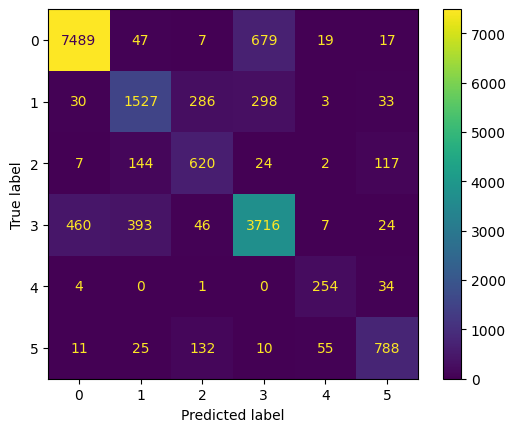

In [177]:
from sklearn.metrics import ConfusionMatrixDisplay
ConfusionMatrixDisplay.from_estimator(voting_clf, X_test_cls_scaled, y_test_cls)

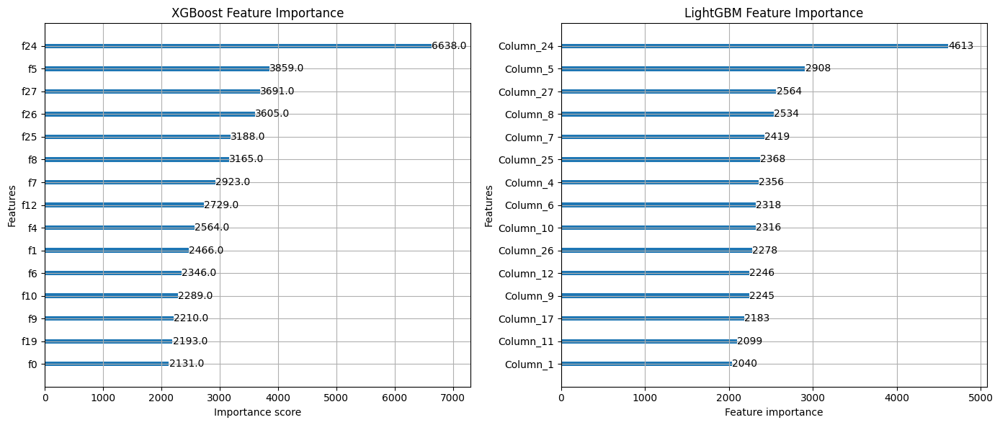

CatBoost Top Features:
pm25_lag1: 38.2147
pm25_roll_24h: 4.7819
Longitude: 4.5197
CO (mg/m³): 4.4788
pm25_lag3: 3.0572
RH (%): 2.8790
BP (mmHg): 2.7942
pm25_roll_3h: 2.5857
Latitude: 2.5336
AT (°C): 2.4952
month_cos: 2.4888
hour_sin: 2.4359
hour: 2.2842
month_sin: 2.2430
WD (deg): 2.1555


In [178]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 2, figsize=(14, 6))

xgb.plot_importance(xgb_best, max_num_features=15, ax=axes[0])
axes[0].set_title("XGBoost Feature Importance")

lgb.plot_importance(lgb_best, max_num_features=15, ax=axes[1])
axes[1].set_title("LightGBM Feature Importance")

plt.tight_layout()
plt.show()

cat_features = cat_cls.get_feature_importance()
print("CatBoost Top Features:")

for feat, score in sorted(zip(X.columns, cat_features), key=lambda x: x[1], reverse=True)[:15]:
    print(f"{feat}: {score:.4f}")


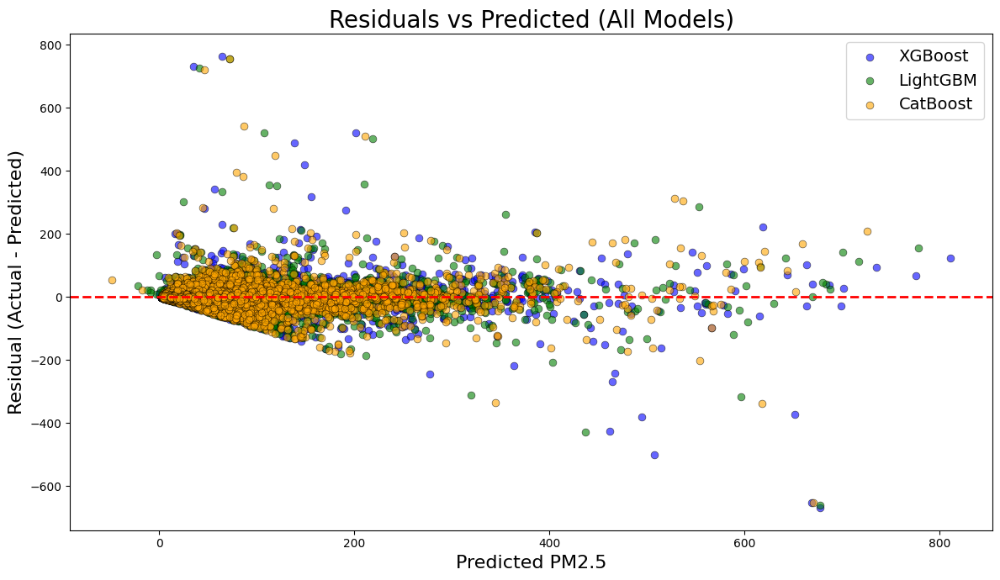

In [179]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import r2_score, mean_squared_error

# Test data
y_true = np.asarray(y_test_reg).ravel()
preds = {
    "XGBoost": y_pred_xgb,
    "LightGBM": y_pred_lgb,
    "CatBoost": y_pred_cat
}

colors = {"XGBoost":"blue", "LightGBM":"green", "CatBoost":"orange"}

plt.figure(figsize=(12,7))

for name, y_pred in preds.items():
    if y_pred is None:
        continue
    y_pred = np.asarray(y_pred).ravel()
    L = min(len(y_true), len(y_pred))
    resid = y_true[:L] - y_pred[:L]

    plt.scatter(
        y_pred[:L], resid,
        alpha=0.6,
        label=name,
        color=colors[name],
        edgecolors="black",
        linewidths=0.5,
        s=40,
        marker="o"
    )

# Thicker red dashed line at 0
plt.axhline(0, color='red', linestyle='--', linewidth=2.0)

plt.xlabel("Predicted PM2.5", fontsize=16)
plt.ylabel("Residual (Actual - Predicted)", fontsize=16)
plt.title("Residuals vs Predicted (All Models)", fontsize=20)
plt.legend(fontsize=14)
plt.tight_layout()
plt.show()


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


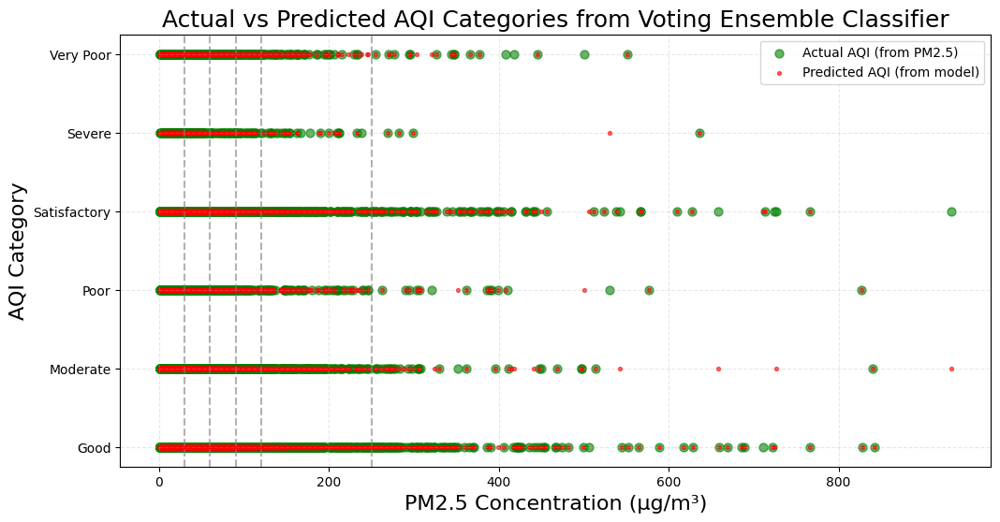

In [192]:
import matplotlib.pyplot as plt

# Predictions from Voting Ensemble
y_pred_vote = voting_clf.predict(X_test_cls_scaled)

# Actual categories
actual_categories = y_test_cls
predicted_categories = y_pred_vote

# PM2.5 test values
pm25_test_values = y_test_reg

# Plot
plt.figure(figsize=(12, 6))
plt.scatter(
    pm25_test_values,
    actual_categories,
    color="green", alpha=0.6, label="Actual AQI (from PM2.5)", s=42
)
plt.scatter(
    pm25_test_values,
    predicted_categories,
    color="red", alpha=0.6, label="Predicted AQI (from model)", s=8
)

plt.xlabel("PM2.5 Concentration (µg/m³)",fontsize=16)
plt.ylabel("AQI Category",fontsize=16)
plt.title("Actual vs Predicted AQI Categories from Voting Ensemble Classifier",fontsize=18)

plt.yticks(
    ticks=range(len(le.classes_)),
    labels=le.classes_
)

# CPCB threshold
thresholds = [30, 60, 90, 120, 250]
for thr in thresholds:
    plt.axvline(x=thr, color="gray", linestyle="--", alpha=0.6)

plt.legend()
plt.grid(True, linestyle="--", alpha=0.3)
plt.show()


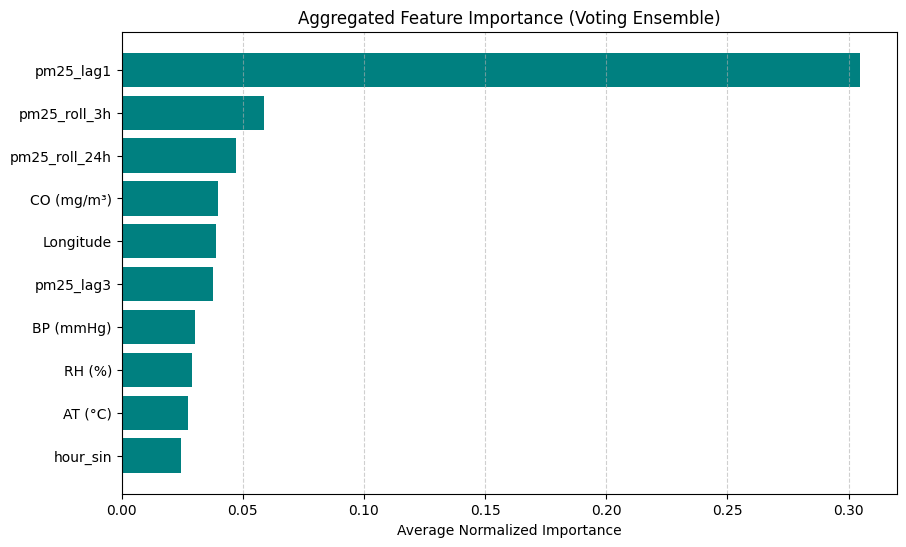

In [195]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Collect feature importances
feat_imp = pd.DataFrame({
    "feature": X_train.columns,
    "xgb": xgb_best.feature_importances_,
    "lgb": lgb_best.feature_importances_,
    "cat": cat_cls.get_feature_importance()
})

# Normalize each model’s importance
for col in ["xgb", "lgb", "cat"]:
    feat_imp[col] = feat_imp[col] / feat_imp[col].sum()

# Average across models
feat_imp["ensemble_importance"] = feat_imp[["xgb", "lgb", "cat"]].mean(axis=1)

# Sort by importance
feat_imp = feat_imp.sort_values("ensemble_importance", ascending=False)

# Plot
plt.figure(figsize=(10, 6))
plt.barh(feat_imp["feature"].head(10), feat_imp["ensemble_importance"].head(10), color="teal")
plt.gca().invert_yaxis()
plt.xlabel("Average Normalized Importance")
plt.title("Aggregated Feature Importance (Voting Ensemble)")
plt.grid(axis="x", linestyle="--", alpha=0.6)
plt.show()
